# Educational Process Mining

https://archive-beta.ics.uci.edu/dataset/346/educational+process+mining+epm+a+learning+analytics+data+set

Educational Process Mining (EPM): A Learning Analytics Data Set. (2015). UCI Machine Learning Repository.

This notebook includes exploratory data analysis of inputs, outputs, and inputs to outputs.

#### Inputs and Intermediate Output

There is an interaction between the continuous variables and the categorical variable `actv_grp`. As revealed by box plots, the distribution of interim scores is different depending on the value of `actv_grp` as follows:

* Sessions 2 and 3: `interim_score` changes when `actv_grp` is 'FSM_Related' or 'Study Materials'
* Sessions 4 and 5: `interim_score` changes when `actv_grp` is 'FSM_Related'
* Session 6: `interim_score` changes when `actv_grp` is 'FSM' or 'Study Materials'

Scatter plots show that the relationships between `interim_score` and the continuous variables change depending on the value of `actv_grp`. For different values of `actv_grp` this relationship is stronger, weaker, or a different direction (positive/negative). 


#### Inputs and Final Output

There is a positive relationship between the final score and final questions final_Es_4_2, final_Es_6_1, and final_Es_6_2. If students did well on these questions, they did well on the exam. Together these questions are worth 50% of the final score.

The total time spent did not appear to have an effect on whether a student passed the final. However, the number of sessions and the variety of exercises and activities in which students participated did have an effect. While participating in more sessions and in a variety of exercise and activities did not guarantee a passing score, if students did not participate in at least four sessions (with the exception of two students) and in a variety of exercises and activities, they did not pass.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

### Load the data from github repository

In [2]:
inputs_path_1 = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/inputs_clean_p1.csv'
inputs_path_2 = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/inputs_clean_p2.csv'
inputs_path_3 = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/inputs_clean_p3.csv'
interim_path = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/interim_df.csv'
final_path = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/final_df.csv'
pts_path = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/final_points_lookup.csv'

In [3]:
inputs_p1 = pd.read_csv(inputs_path_1)

In [4]:
inputs_p2 = pd.read_csv(inputs_path_2)

In [5]:
inputs_p3 = pd.read_csv(inputs_path_3)

In [6]:
inputs_init = pd.concat([inputs_p1, inputs_p2, inputs_p3], ignore_index=True, axis=0)

In [7]:
interim_init = pd.read_csv(interim_path)

In [8]:
final_init = pd.read_csv(final_path)

In [9]:
pts_final_lookup = pd.read_csv(pts_path)

In [10]:
inputs_init.columns

Index(['sess', 'sid', 'start_dt', 'end_dt', 'exer', 'actv', 'actv_grp',
       'total_ms', 'idle_ms', 'mw', 'mwc', 'mcl', 'mcr', 'mm', 'ks',
       'total_ms_wdz', 'idle_ms_wdz', 'mw_wdz', 'mwc_wdz', 'mcl_wdz',
       'mcr_wdz', 'mm_wdz', 'ks_wdz', 'total_ms_sqrt', 'idle_ms_sqrt',
       'mw_sqrt', 'mwc_sqrt', 'mcl_sqrt', 'mcr_sqrt', 'mm_sqrt', 'ks_sqrt'],
      dtype='object')

In [11]:
interim_init.columns

Index(['sid', 'interim_scr2', 'interim_scr3', 'interim_scr4', 'interim_scr5',
       'interim_scr6'],
      dtype='object')

In [12]:
final_init.columns

Index(['sid', 'Es_1q1', 'Es_1q2', 'Es_2q1', 'Es_2q2', 'Es_3q1', 'Es_3q2',
       'Es_3q3', 'Es_3q4', 'Es_3q5', 'Es_4q1', 'Es_4q2', 'Es_5q1', 'Es_5q2',
       'Es_5q3', 'Es_6q1', 'Es_6q2', 'final_score'],
      dtype='object')

In [13]:
pts_final_lookup.columns

Index(['question', 'question_points'], dtype='object')

## Inputs

In [14]:
inputs_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 31 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   sess           227129 non-null  int64  
 1   sid            227129 non-null  int64  
 2   start_dt       227129 non-null  object 
 3   end_dt         227128 non-null  object 
 4   exer           227129 non-null  object 
 5   actv           227129 non-null  object 
 6   actv_grp       227129 non-null  object 
 7   total_ms       227128 non-null  float64
 8   idle_ms        226971 non-null  float64
 9   mw             227129 non-null  int64  
 10  mwc            227129 non-null  int64  
 11  mcl            227129 non-null  int64  
 12  mcr            227129 non-null  int64  
 13  mm             227129 non-null  int64  
 14  ks             227129 non-null  int64  
 15  total_ms_wdz   227129 non-null  float64
 16  idle_ms_wdz    227129 non-null  float64
 17  mw_wdz         227129 non-nul

In [15]:
inputs_init.isna().sum()

sess               0
sid                0
start_dt           0
end_dt             1
exer               0
actv               0
actv_grp           0
total_ms           1
idle_ms          158
mw                 0
mwc                0
mcl                0
mcr                0
mm                 0
ks                 0
total_ms_wdz       0
idle_ms_wdz        0
mw_wdz             0
mwc_wdz            0
mcl_wdz            0
mcr_wdz            0
mm_wdz             0
ks_wdz             0
total_ms_sqrt      1
idle_ms_sqrt     158
mw_sqrt            0
mwc_sqrt           0
mcl_sqrt           0
mcr_sqrt           0
mm_sqrt            0
ks_sqrt            0
dtype: int64

In [16]:
inputs_init['sid'] = inputs_init['sid'].astype('object')
inputs_init['sess'] = inputs_init['sess'].astype('object')

In [17]:
def get_var_list(df, lst):
    temp = []
    for s in lst:
        temp = [j for i in [temp, df.loc[:, df.columns.str.endswith(s)].columns] for j in i] 
    return temp

In [18]:
sqrt_vars = get_var_list(inputs_init,['sqrt'])
wdz_vars = get_var_list(inputs_init,['wdz'])
sqrt_ms_vars = get_var_list(inputs_init,['ms_sqrt'])
wdz_ms_vars = get_var_list(inputs_init,['ms_wdz'])
orig_ms_vars = get_var_list(inputs_init, ['ms'])
cat_vars = inputs_init.drop(columns=['actv','start_dt','end_dt']).copy().select_dtypes('object').columns.to_list()

In [19]:
num_vars = inputs_init.select_dtypes('number').columns.to_list()
num_vars

['total_ms',
 'idle_ms',
 'mw',
 'mwc',
 'mcl',
 'mcr',
 'mm',
 'ks',
 'total_ms_wdz',
 'idle_ms_wdz',
 'mw_wdz',
 'mwc_wdz',
 'mcl_wdz',
 'mcr_wdz',
 'mm_wdz',
 'ks_wdz',
 'total_ms_sqrt',
 'idle_ms_sqrt',
 'mw_sqrt',
 'mwc_sqrt',
 'mcl_sqrt',
 'mcr_sqrt',
 'mm_sqrt',
 'ks_sqrt']

In [20]:
orig_vars = [v for v in num_vars if v not in sqrt_vars + wdz_vars]
orig_vars

['total_ms', 'idle_ms', 'mw', 'mwc', 'mcl', 'mcr', 'mm', 'ks']

In [21]:
activity_orig_vars = [v for v in orig_vars if v not in orig_ms_vars]
activity_orig_vars

['mw', 'mwc', 'mcl', 'mcr', 'mm', 'ks']

In [22]:
activity_sqrt_vars = [v for v in sqrt_vars if v not in sqrt_ms_vars]
activity_sqrt_vars

['mw_sqrt', 'mwc_sqrt', 'mcl_sqrt', 'mcr_sqrt', 'mm_sqrt', 'ks_sqrt']

In [23]:
activity_wdz_vars = [v for v in wdz_vars if v not in wdz_ms_vars]
activity_wdz_vars

['mw_wdz', 'mwc_wdz', 'mcl_wdz', 'mcr_wdz', 'mm_wdz', 'ks_wdz']

In [24]:
cat_vars

['sess', 'sid', 'exer', 'actv_grp']

In [25]:
sqrt_vars

['total_ms_sqrt',
 'idle_ms_sqrt',
 'mw_sqrt',
 'mwc_sqrt',
 'mcl_sqrt',
 'mcr_sqrt',
 'mm_sqrt',
 'ks_sqrt']

In [26]:
wdz_vars

['total_ms_wdz',
 'idle_ms_wdz',
 'mw_wdz',
 'mwc_wdz',
 'mcl_wdz',
 'mcr_wdz',
 'mm_wdz',
 'ks_wdz']

## Outputs

In [27]:
interim_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sid           115 non-null    int64  
 1   interim_scr2  115 non-null    float64
 2   interim_scr3  115 non-null    float64
 3   interim_scr4  115 non-null    float64
 4   interim_scr5  115 non-null    float64
 5   interim_scr6  115 non-null    float64
dtypes: float64(5), int64(1)
memory usage: 5.5 KB


In [28]:
interim_init.isna().sum()

sid             0
interim_scr2    0
interim_scr3    0
interim_scr4    0
interim_scr5    0
interim_scr6    0
dtype: int64

In [29]:
final_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   sid          62 non-null     int64  
 1   Es_1q1       62 non-null     float64
 2   Es_1q2       62 non-null     float64
 3   Es_2q1       62 non-null     float64
 4   Es_2q2       62 non-null     float64
 5   Es_3q1       62 non-null     float64
 6   Es_3q2       62 non-null     float64
 7   Es_3q3       62 non-null     float64
 8   Es_3q4       62 non-null     float64
 9   Es_3q5       62 non-null     float64
 10  Es_4q1       62 non-null     float64
 11  Es_4q2       62 non-null     float64
 12  Es_5q1       62 non-null     float64
 13  Es_5q2       62 non-null     float64
 14  Es_5q3       62 non-null     float64
 15  Es_6q1       62 non-null     float64
 16  Es_6q2       62 non-null     float64
 17  final_score  62 non-null     float64
dtypes: float64(17), int64(1)
memory usage: 8.8 KB


In [30]:
final_init.isna().sum()

sid            0
Es_1q1         0
Es_1q2         0
Es_2q1         0
Es_2q2         0
Es_3q1         0
Es_3q2         0
Es_3q3         0
Es_3q4         0
Es_3q5         0
Es_4q1         0
Es_4q2         0
Es_5q1         0
Es_5q2         0
Es_5q3         0
Es_6q1         0
Es_6q2         0
final_score    0
dtype: int64

In [31]:
pts_final_lookup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   question         17 non-null     object
 1   question_points  17 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 400.0+ bytes


In [32]:
pts_final_lookup.question.unique()

array(['Es_1q1', 'Es_1q2', 'Es_2q1', 'Es_2q2', 'Es_3q1', 'Es_3q2',
       'Es_3q3', 'Es_3q4', 'Es_3q5', 'Es_4q1', 'Es_4q2', 'Es_5q1',
       'Es_5q2', 'Es_5q3', 'Es_6q1', 'Es_6q2', 'final_score'],
      dtype=object)

#### Add classification variable to indicate event 'pass' if composite score is greater than or equal to 70

In [33]:
final_init['pass'] = np.where( final_init['final_score'] >= 70, 1, 0 )

## Explore the input data

In [34]:
inputs_df = inputs_init.copy()

In [35]:
inputs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 31 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   sess           227129 non-null  object 
 1   sid            227129 non-null  object 
 2   start_dt       227129 non-null  object 
 3   end_dt         227128 non-null  object 
 4   exer           227129 non-null  object 
 5   actv           227129 non-null  object 
 6   actv_grp       227129 non-null  object 
 7   total_ms       227128 non-null  float64
 8   idle_ms        226971 non-null  float64
 9   mw             227129 non-null  int64  
 10  mwc            227129 non-null  int64  
 11  mcl            227129 non-null  int64  
 12  mcr            227129 non-null  int64  
 13  mm             227129 non-null  int64  
 14  ks             227129 non-null  int64  
 15  total_ms_wdz   227129 non-null  float64
 16  idle_ms_wdz    227129 non-null  float64
 17  mw_wdz         227129 non-nul

In [36]:
inputs_df.exer.value_counts()

Es_4_5    22091
Es_6_3    19290
Es_6_2    15996
Es_6_1    13505
Es_5_4    12217
Es_1_1    11406
Es_2_2    10414
Es_3_2    10131
Es_1_2     9614
Es_5_1     9090
Es_2_1     7952
Es_3_1     7637
Es_2_4     7559
Es_5_3     7219
Es_1_3     6716
Es_2_3     6082
Es_4_1     5727
Es_1_4     5502
Es_3_4     5344
Es_5_2     5156
Es_3_3     4680
Es_2_5     4241
Es_4_2     4044
Es_4_3     3757
Es_4_4     3364
Es_6_4     2939
Es         2647
Es_2_6     2573
Es_6_6      135
Es_6_5      101
Name: exer, dtype: int64

#### Aggregate by student to count the unique values of `sess`, `exer`, `actv`, and `actv_grp` for each student

In [37]:
sid_counts = inputs_df.groupby(['sid']).\
            aggregate(sess_uniq = ('sess', 'nunique'),
                      exer_uniq = ('exer', 'nunique'),
                      actv_uniq = ('actv', 'nunique'),
                      actv_grp_uniq = ('actv_grp', 'nunique')).\
            reset_index().copy()

In [38]:
sid_counts.head()

,sid,sess_uniq,exer_uniq,actv_uniq,actv_grp_uniq
0,1,5,23,78,10
1,2,6,30,92,10
2,3,4,19,61,8
3,4,6,27,83,10
4,5,6,27,83,10


In [39]:
sid_counts.loc[sid_counts['actv_uniq'] == max(sid_counts['actv_uniq'])]

,sid,sess_uniq,exer_uniq,actv_uniq,actv_grp_uniq
31,32,6,30,93,11
43,44,6,29,93,11
51,52,6,29,93,10
69,70,6,30,93,10
80,81,6,30,93,10
84,85,6,29,93,11
93,94,6,30,93,10


#### Bar charts show progression through the course by participation in exercises and activities for student 32 who has high partitipation.

##### Each record represents an interval of time during which a student performed or participated in an activity, related to a particular exercise, within a session.

The `actv` variable value is a composite value consisting of an activity type and an exercise. The activity type was extracted from `actv` to create a new `actv_grp`. 

The bar chart below illustrates how student 32 progressses through the exercises (`exer`) and activity types (`actv_grp`) for each session (`sess`).

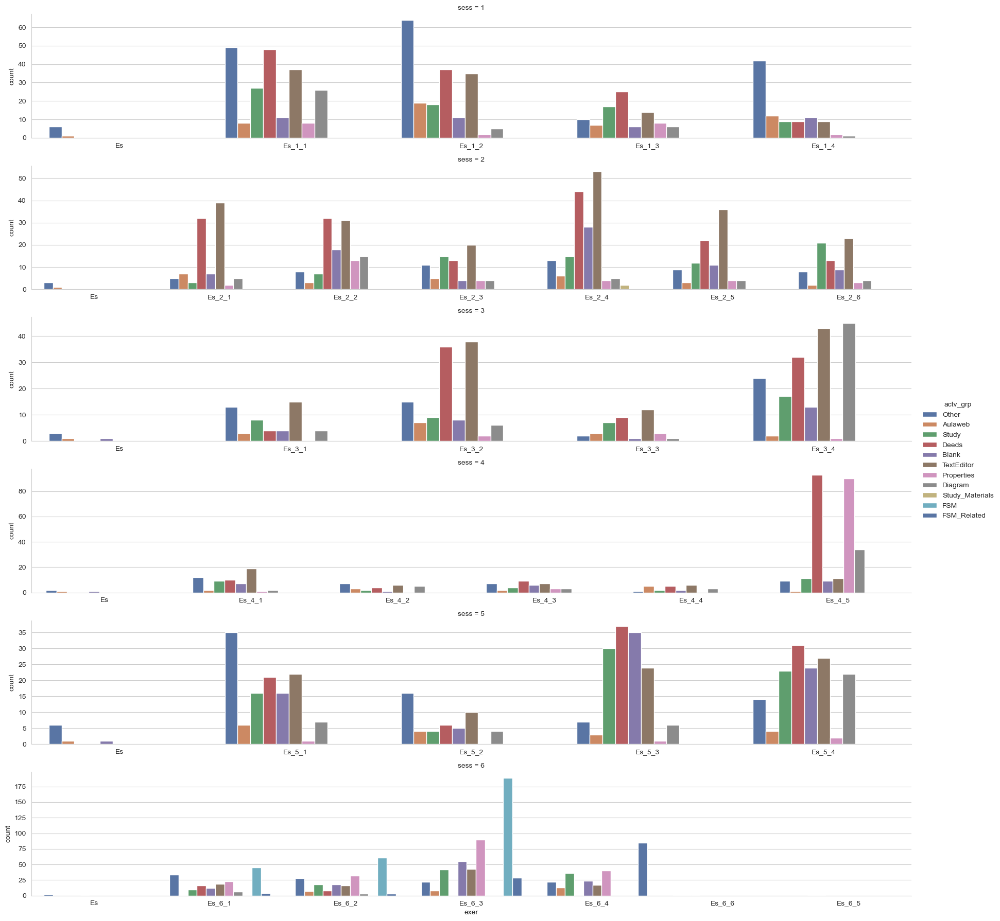

In [40]:
sns.set_style('whitegrid')

sns.catplot(data = inputs_df.loc[inputs_df['sid'] == 32], x='exer', col='sess', hue='actv_grp', 
            col_wrap=1, kind='count', palette='deep',
            height=3, aspect=6, sharey=False, sharex=False)

plt.show()

The bar chart below illustrates how student 32 progressses through the sessions (`sess`) by activity type (`actv_grp`).

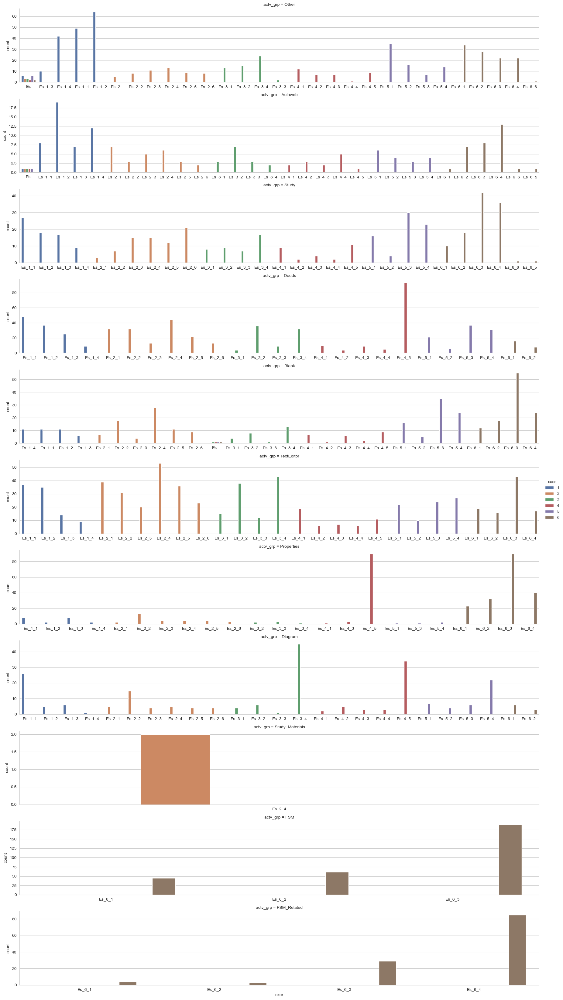

In [41]:
sns.set_style('whitegrid')

sns.catplot(data = inputs_df.loc[inputs_df['sid'] == 32], x='exer', col='actv_grp', hue='sess', 
            col_wrap=1, kind='count', palette='deep',
            height=3, aspect=6, sharey=False, sharex=False)

plt.show()

In [42]:
inputs_df.loc[inputs_df['sid'].isin([32, 44, 85])]

,sess,sid,start_dt,end_dt,exer,actv,actv_grp,total_ms,idle_ms,mw,...,mm_wdz,ks_wdz,total_ms_sqrt,idle_ms_sqrt,mw_sqrt,mwc_sqrt,mcl_sqrt,mcr_sqrt,mm_sqrt,ks_sqrt
7807,1,32,2014-02-10 11:24:18,2014-02-10 11:24:22,Es,Other,Other,4000.0,4242.0,0,...,79.0,0.0,63.245553,65.130638,0.0,0.0,0.000000,0.0,8.888194,0.0
7808,1,32,2014-02-10 11:24:23,2014-02-10 11:24:23,Es,Other,Other,0.0,0.0,0,...,43.0,0.0,0.000000,0.000000,0.0,0.0,1.414214,0.0,6.557439,0.0
7809,1,32,2014-02-10 11:24:24,2014-02-10 11:24:24,Es,Other,Other,0.0,0.0,0,...,58.0,0.0,0.000000,0.000000,0.0,0.0,1.414214,0.0,7.615773,0.0
7810,1,32,2014-02-10 11:24:25,2014-02-10 11:24:46,Es,Other,Other,21000.0,185772.0,0,...,82.0,0.0,144.913767,431.012761,0.0,0.0,1.414214,0.0,9.055385,0.0
7811,1,32,2014-02-10 11:24:47,2014-02-10 11:24:49,Es,Other,Other,2000.0,94.0,0,...,194.0,0.0,44.721360,9.695360,0.0,0.0,1.414214,0.0,13.928388,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218288,6,85,2014-11-12 13:55:44,2014-11-12 13:55:45,Es_6_6,Other,Other,1000.0,124.0,0,...,90.0,0.0,31.622777,11.135529,0.0,0.0,1.414214,0.0,9.486833,0.0
218289,6,85,2014-11-12 13:55:46,2014-11-12 13:55:58,Es_6_6,Study_Es_6_6,Study,12000.0,19722.0,0,...,217.0,0.0,109.544512,140.435038,0.0,0.0,2.000000,0.0,14.730920,0.0
218290,6,85,2014-11-12 13:55:59,2014-11-12 13:55:59,Es_6_6,Blank,Blank,0.0,0.0,0,...,61.0,0.0,0.000000,0.000000,0.0,0.0,1.414214,0.0,7.810250,0.0
218291,6,85,2014-11-12 13:56:00,2014-11-12 13:56:04,Es_6_6,Aulaweb,Aulaweb,4000.0,0.0,0,...,193.0,0.0,63.245553,0.000000,0.0,0.0,2.000000,0.0,13.892444,0.0


The bar chart below illustrates how students 32, 44, and 85 progress through the activities (`actv`), which is the combined exercise and activity type, by session.

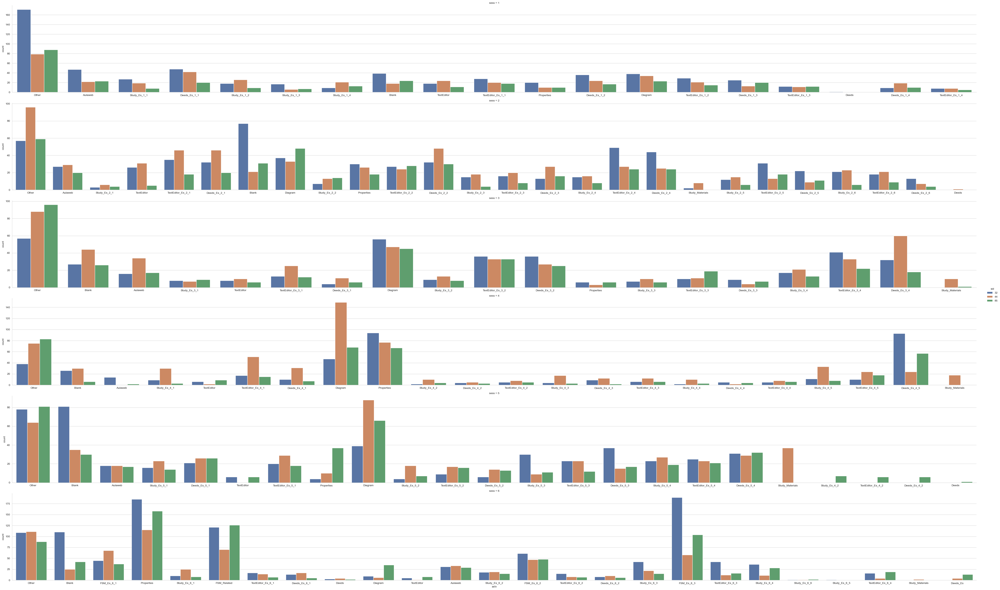

In [43]:
sns.set_style('whitegrid')

sns.catplot(data = inputs_df.loc[inputs_df['sid'].isin([32, 44, 85])], x='actv', col='sess', hue='sid', 
            col_wrap=1, kind='count', palette='deep',
            height=5, aspect=10, sharey=False, sharex=False)

plt.show()

#### Select 3 students with high participation and 3 students with low participation for heatmaps

In [44]:
sid_counts.loc[sid_counts['actv_uniq'] == max(sid_counts['actv_uniq'])]

,sid,sess_uniq,exer_uniq,actv_uniq,actv_grp_uniq
31,32,6,30,93,11
43,44,6,29,93,11
51,52,6,29,93,10
69,70,6,30,93,10
80,81,6,30,93,10
84,85,6,29,93,11
93,94,6,30,93,10


In [45]:
sid_counts.loc[sid_counts['actv_uniq'] <= np.quantile(sid_counts['actv_uniq'], 0.15)]

,sid,sess_uniq,exer_uniq,actv_uniq,actv_grp_uniq
25,26,1,6,9,5
32,33,1,6,20,8
56,57,2,10,30,10
57,58,1,6,16,6
61,62,2,10,34,8
76,77,1,6,16,6
88,89,4,12,28,9
102,103,2,10,34,9
104,105,2,11,26,8
105,106,1,5,19,9


In [46]:
sid_counts.loc[sid_counts['actv_uniq'] == max(sid_counts['actv_uniq'])]

,sid,sess_uniq,exer_uniq,actv_uniq,actv_grp_uniq
31,32,6,30,93,11
43,44,6,29,93,11
51,52,6,29,93,10
69,70,6,30,93,10
80,81,6,30,93,10
84,85,6,29,93,11
93,94,6,30,93,10


#### Aggregate by student and session to count the number of unique values of `exer`, `actv`, and `actv_grp` for each student and session

In [47]:
sid_sess_counts = inputs_df.groupby(['sid', 'sess']).\
            aggregate(exer_uniq = ('exer', 'nunique'),
                      actv_uniq = ('actv', 'nunique'),
                      actv_grp_uniq = ('actv_grp', 'nunique')).\
            reset_index().copy()

In [48]:
sid_sess_counts

,sid,sess,exer_uniq,actv_uniq,actv_grp_uniq
0,1,1,5,20,8
1,1,2,7,25,8
2,1,4,6,23,9
3,1,5,5,18,8
4,1,6,4,18,10
...,...,...,...,...,...
509,110,1,5,18,8
510,111,1,5,20,9
511,112,1,5,19,8
512,113,1,5,19,8


In [49]:
sid_sess_counts.loc[ (sid_sess_counts.sid.isin([32, 44, 85]))]

,sid,sess,exer_uniq,actv_uniq,actv_grp_uniq
152,32,1,5,19,8
153,32,2,7,25,9
154,32,3,5,18,8
155,32,4,6,21,8
156,32,5,5,18,8
157,32,6,7,23,10
208,44,1,5,18,8
209,44,2,7,26,9
210,44,3,5,19,9
211,44,4,6,21,8


In [50]:
sid_sess_counts.loc[ (sid_sess_counts.sid.isin([57, 77, 89]))]

,sid,sess,exer_uniq,actv_uniq,actv_grp_uniq
277,57,4,6,16,6
278,57,6,5,20,10
365,77,4,6,16,6
428,89,3,4,11,7
429,89,4,6,17,7
430,89,5,2,6,5
431,89,6,3,10,8


In [51]:
uniq_vars = get_var_list(sid_sess_counts,['uniq'])

In [52]:
sid_3high_sess_counts = sid_sess_counts.loc[sid_sess_counts.sid.isin([32, 44, 85])].copy()

In [53]:
sid_3high_sess_counts.head()

,sid,sess,exer_uniq,actv_uniq,actv_grp_uniq
152,32,1,5,19,8
153,32,2,7,25,9
154,32,3,5,18,8
155,32,4,6,21,8
156,32,5,5,18,8


In [54]:
the_sessions = sid_3high_sess_counts.sess.unique().tolist()

In [55]:
sid_3high_sess_counts.reset_index()[['sid','sess', uniq_vars[0]]].pivot(index='sid', columns='sess', values=uniq_vars[0])

sess,1,2,3,4,5,6
sid,,,,,,
32,5,7,5,6,5,7
44,5,7,5,6,5,6
85,5,7,5,6,6,6


#### Heatmaps show participation as the unique count of exercises, activities, and activity groups for the selected students with high and low participation

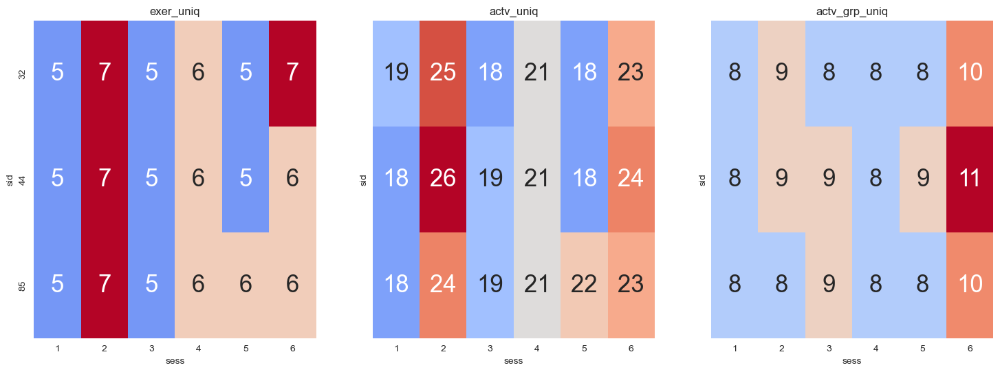

In [56]:
fig, axs = plt.subplots(1, len(uniq_vars), figsize=(18,6), sharex=True, sharey=True)

for ix, x in enumerate(uniq_vars):
    sns.heatmap(data = sid_3high_sess_counts.reset_index()[['sid','sess', x]].pivot(index='sid', columns='sess', values=x),
                center=sid_3high_sess_counts.reset_index()[x].mean(),
                cmap='coolwarm', cbar=False,
                annot=True, annot_kws={'size': 25},
                ax=axs[ix])
    
    axs[ix].set_title(str(x))

plt.show()

In [57]:
sid_sess_counts.loc[ (sid_sess_counts.sid.isin([57, 77, 89]))]

,sid,sess,exer_uniq,actv_uniq,actv_grp_uniq
277,57,4,6,16,6
278,57,6,5,20,10
365,77,4,6,16,6
428,89,3,4,11,7
429,89,4,6,17,7
430,89,5,2,6,5
431,89,6,3,10,8


In [58]:
sid_3low_sess_counts = sid_sess_counts.loc[sid_sess_counts.sid.isin([57, 77, 89])].copy()

In [59]:
the_sessions_low = sid_3low_sess_counts.sess.unique().tolist()

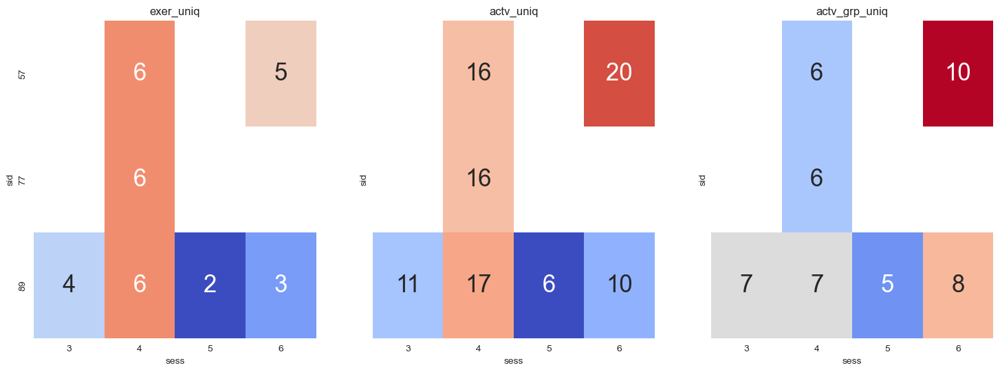

In [60]:
fig, axs = plt.subplots(1, len(uniq_vars), figsize=(18,6), sharex=True, sharey=True)

for ix, x in enumerate(uniq_vars):
    sns.heatmap(data = sid_3low_sess_counts.reset_index()[['sid','sess', x]].pivot(index='sid', columns='sess', values=x),
                center=sid_3low_sess_counts.reset_index()[x].mean(),
                cmap='coolwarm', cbar=False,
                annot=True, annot_kws={'size': 25},
                ax=axs[ix])
    
    axs[ix].set_title(str(x))

plt.show()

#### Scatter plots show unique exercises, activities, and activity groups counts by student and session for all students

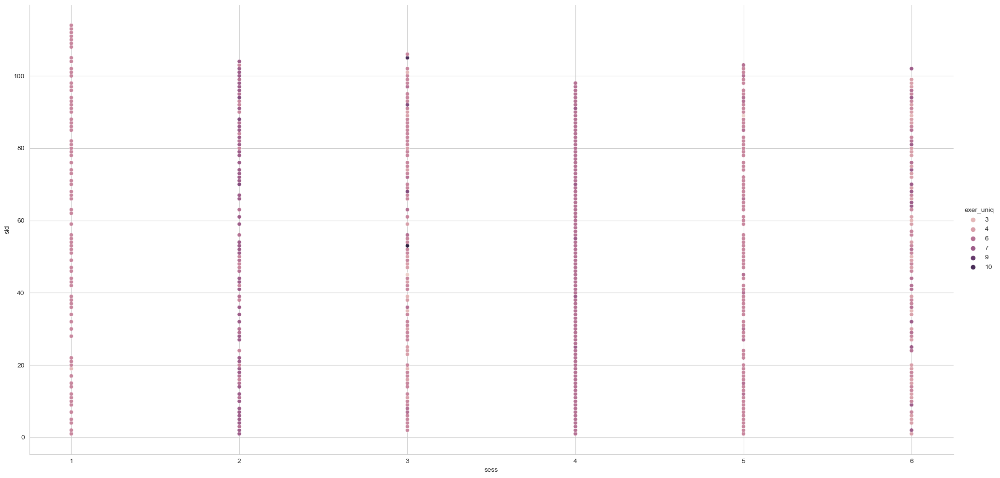

In [61]:
sns.relplot(data = sid_sess_counts, x='sess', y='sid', hue='exer_uniq', height=10, aspect=2)

plt.show()

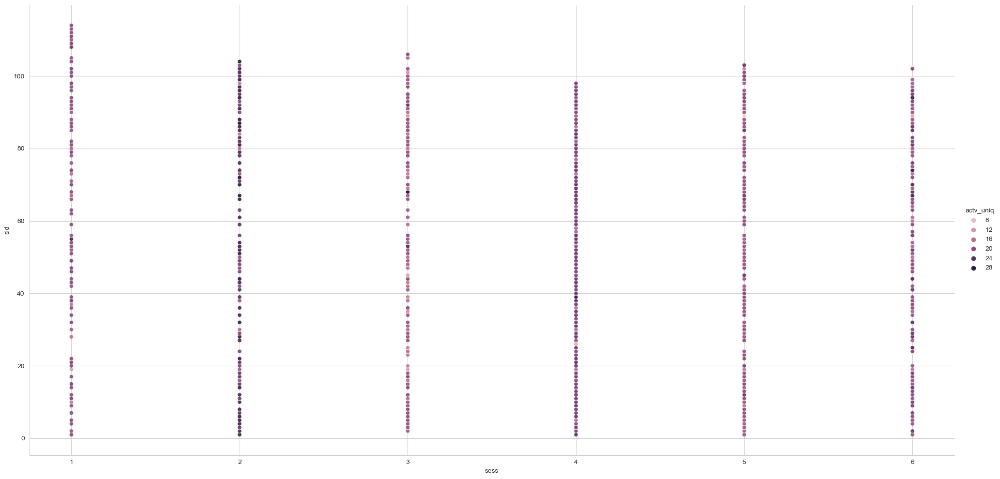

In [62]:
sns.relplot(data = sid_sess_counts, x='sess', y='sid', hue='actv_uniq', height=10, aspect=2)

plt.show()

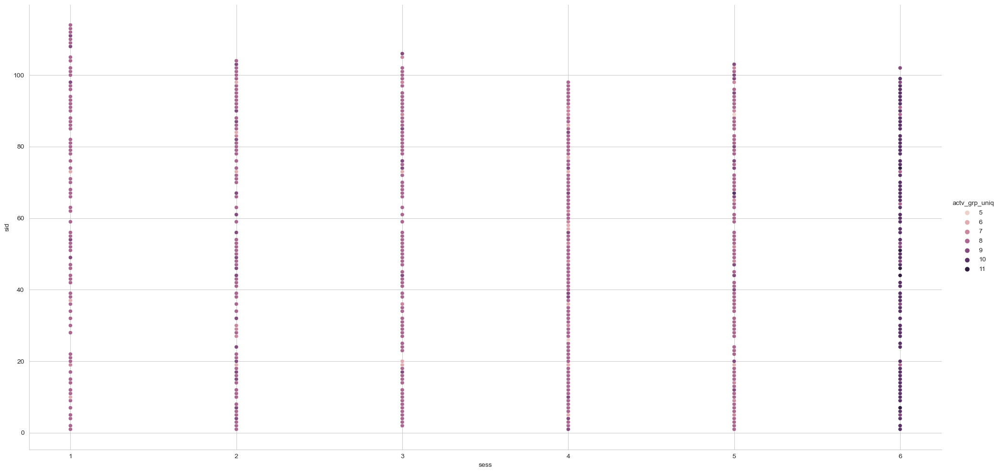

In [63]:
sns.relplot(data = sid_sess_counts, x='sess', y='sid', hue='actv_grp_uniq', height=10, aspect=2)

plt.show()

#### The number of records per exercise by student

In [64]:
sns.set_style('whitegrid')

sns.catplot(data = inputs_df, x='exer', col='sid', col_wrap=1, kind='count', color='slategray',
            height=3, aspect=6, sharey=False, sharex=False)

plt.show()

#### The number of records per activity by student

In [65]:
inputs_df.actv_grp.value_counts()

TextEditor         41900
Deeds              38000
Other              33009
Blank              23929
Study              21540
Diagram            20546
Properties         19419
FSM                17000
Aulaweb             8113
FSM_Related         3275
Study_Materials      398
Name: actv_grp, dtype: int64

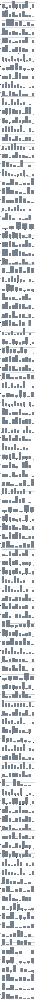

In [66]:
sns.set_style('whitegrid')

sns.catplot(data = inputs_df, x='actv_grp', col='sid', col_wrap=1, kind='count', color='slategray',
            height=3, aspect=4, sharey=False, sharex=False)

plt.show()

#### The number of records per student by session

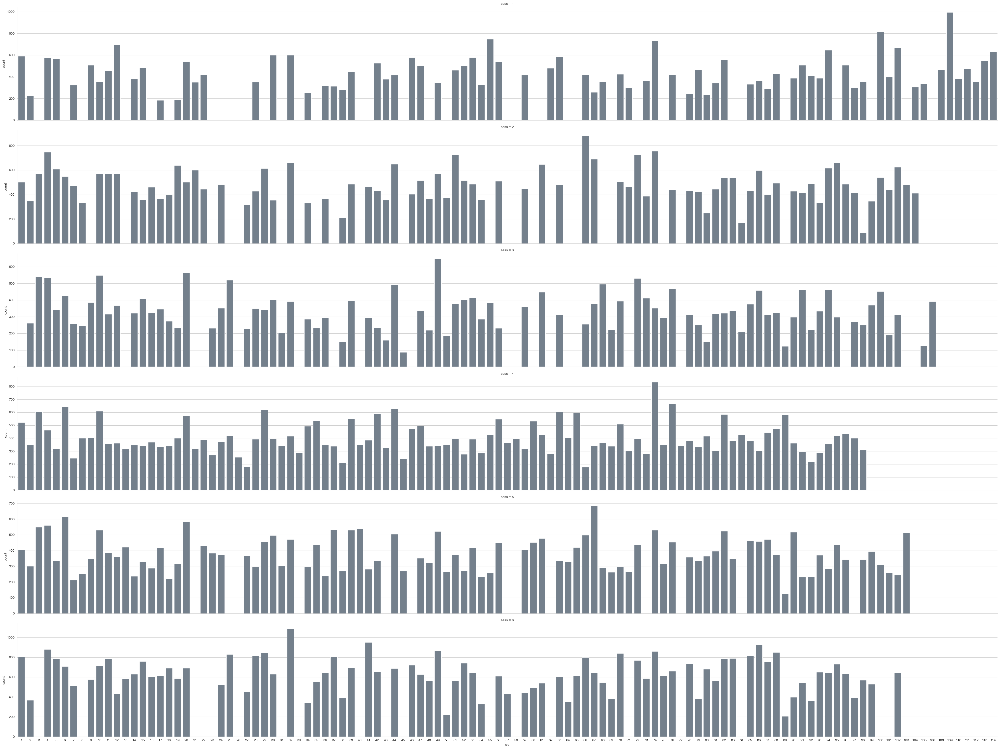

In [67]:
sns.catplot(data = inputs_df, x='sid', col='sess', col_wrap=1, kind='count', color='slategray',
            height=5, aspect=8, sharey=False)

plt.show()

#### The number of records per session by student

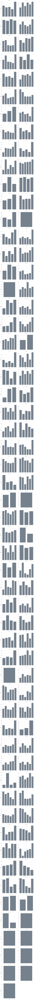

In [68]:
sns.catplot(data = inputs_df, x='sess', col='sid', col_wrap=2, kind='count', color='slategray',
            sharey=False, sharex=False)

plt.show()

#### The distribution of numeric variables (sqrt)

In [69]:
inputs_sqrt_df = inputs_df[cat_vars + sqrt_vars].copy()

In [70]:
inputs_sqrt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 12 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   sess           227129 non-null  object 
 1   sid            227129 non-null  object 
 2   exer           227129 non-null  object 
 3   actv_grp       227129 non-null  object 
 4   total_ms_sqrt  227128 non-null  float64
 5   idle_ms_sqrt   226971 non-null  float64
 6   mw_sqrt        227129 non-null  float64
 7   mwc_sqrt       227129 non-null  float64
 8   mcl_sqrt       227129 non-null  float64
 9   mcr_sqrt       227129 non-null  float64
 10  mm_sqrt        227129 non-null  float64
 11  ks_sqrt        227129 non-null  float64
dtypes: float64(8), object(4)
memory usage: 20.8+ MB


In [71]:
inputs_sqrt_df.describe()

,total_ms_sqrt,idle_ms_sqrt,mw_sqrt,mwc_sqrt,mcl_sqrt,mcr_sqrt,mm_sqrt,ks_sqrt
count,227128.000000,226971.000000,227129.000000,227129.000000,227129.000000,227129.000000,227129.000000,227129.000000
mean,75.724962,221.136780,0.380204,0.002757,1.994965,0.114958,15.115336,0.661013
std,100.630429,1046.482145,1.600802,0.073777,1.759565,0.568873,13.643873,2.417640
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.414214,0.000000,7.874008,0.000000
50%,44.721360,8.944272,0.000000,0.000000,1.414214,0.000000,11.704700,0.000000
75%,94.868330,75.766087,0.000000,0.000000,2.236068,0.000000,18.303005,0.000000
max,1964.942747,85116.014486,53.888774,7.745967,33.105891,12.961481,293.170599,68.949257


In [72]:
cat_vars

['sess', 'sid', 'exer', 'actv_grp']

In [73]:
inputs_sqrt_lf = inputs_sqrt_df.melt( id_vars=cat_vars, 
                  value_vars=sqrt_vars).copy()

In [74]:
inputs_sqrt_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1817032 entries, 0 to 1817031
Data columns (total 6 columns):
 #   Column    Dtype  
---  ------    -----  
 0   sess      object 
 1   sid       object 
 2   exer      object 
 3   actv_grp  object 
 4   variable  object 
 5   value     float64
dtypes: float64(1), object(5)
memory usage: 83.2+ MB


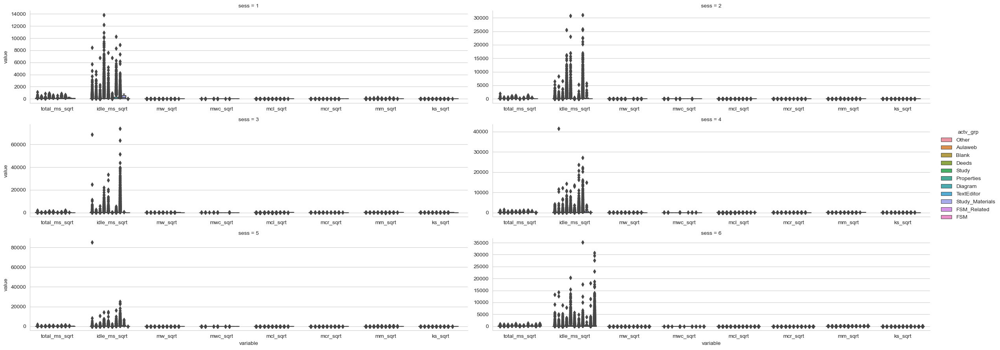

In [75]:
sns.catplot(data=inputs_sqrt_lf, x = 'variable', y = 'value', 
            col = 'sess', col_wrap=2, kind = 'box', 
            hue = 'actv_grp', height=3, aspect=4, 
            sharey=False, sharex=False)

plt.show()

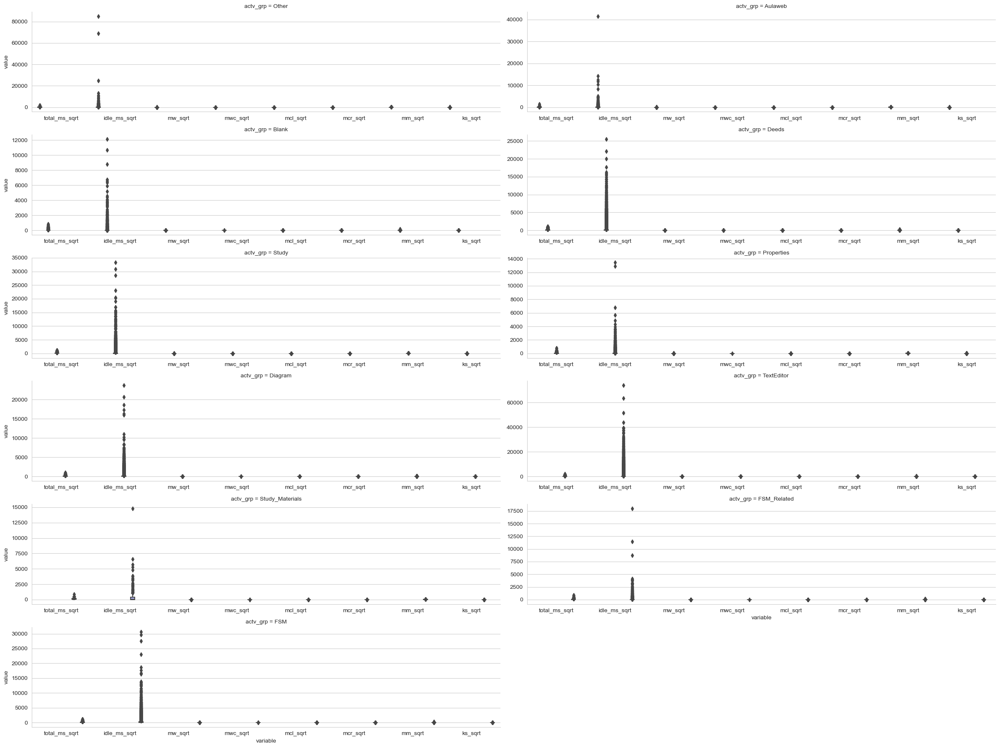

In [76]:
sns.catplot(data=inputs_sqrt_lf, x = 'variable', y = 'value', 
            col = 'actv_grp', col_wrap=2, kind = 'box', 
            hue = 'actv_grp', height=3, aspect=4, 
            sharey=False, sharex=False)

plt.show()

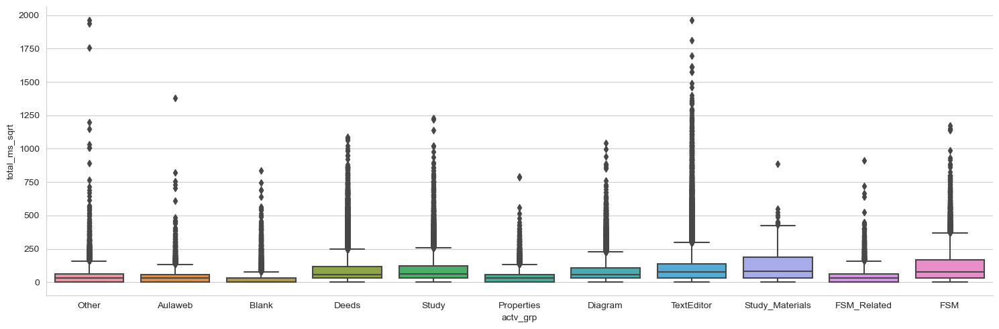

In [77]:
sns.catplot(data = inputs_sqrt_df, x='actv_grp', y='total_ms_sqrt', kind='box', aspect=3)

plt.show()

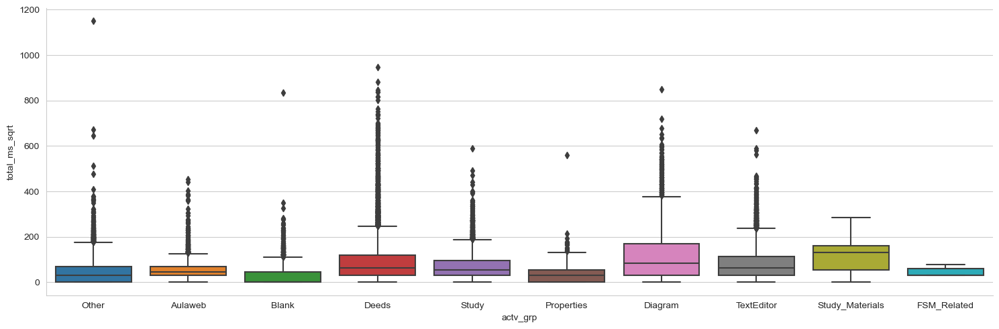

In [78]:
sns.catplot(data = inputs_sqrt_df.loc[inputs_sqrt_df.sess==1], x='actv_grp', y='total_ms_sqrt', kind='box', aspect=3)

plt.show()

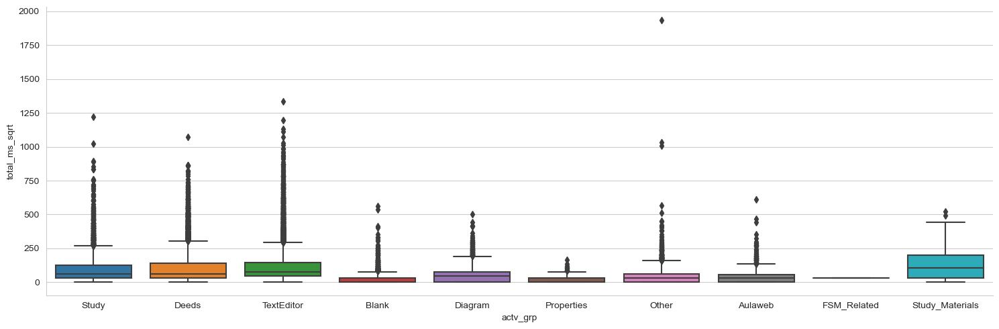

In [79]:
sns.catplot(data = inputs_sqrt_df.loc[inputs_sqrt_df.sess==2], x='actv_grp', y='total_ms_sqrt', kind='box', aspect=3)

plt.show()

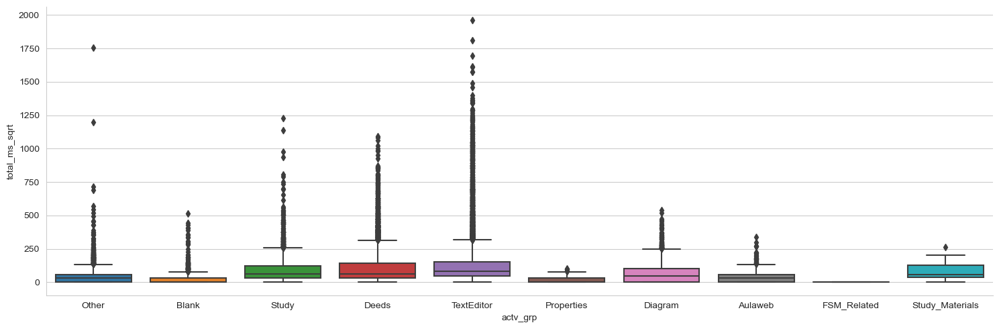

In [80]:
sns.catplot(data = inputs_sqrt_df.loc[inputs_sqrt_df.sess==3], x='actv_grp', y='total_ms_sqrt', kind='box', aspect=3)

plt.show()

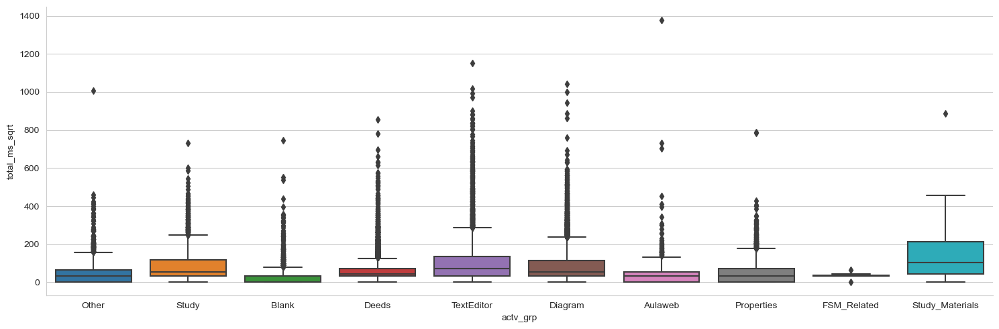

In [81]:
sns.catplot(data = inputs_sqrt_df.loc[inputs_sqrt_df.sess==4], x='actv_grp', y='total_ms_sqrt', kind='box', aspect=3)

plt.show()

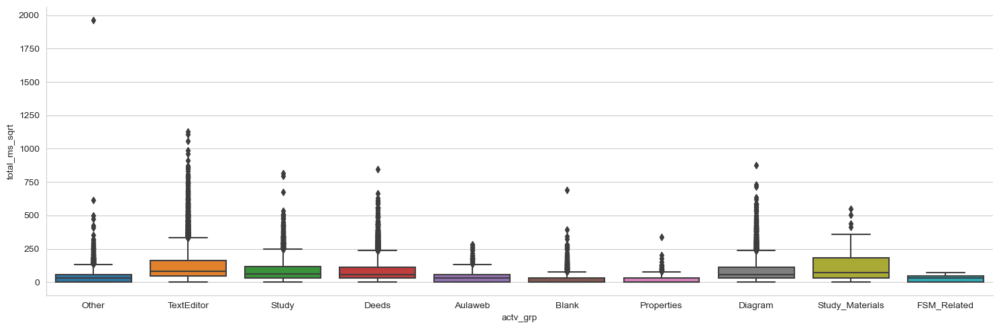

In [82]:
sns.catplot(data = inputs_sqrt_df.loc[inputs_sqrt_df.sess==5], x='actv_grp', y='total_ms_sqrt', kind='box', aspect=3)

plt.show()

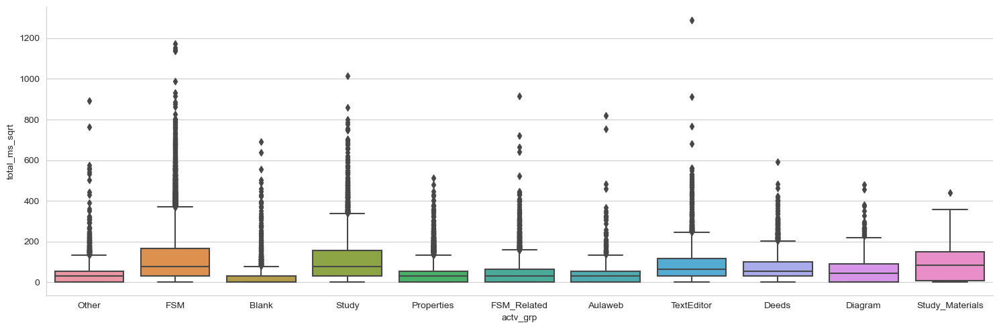

In [83]:
sns.catplot(data = inputs_sqrt_df.loc[inputs_sqrt_df.sess==6], x='actv_grp', y='total_ms_sqrt', kind='box', aspect=3)

plt.show()

#### Correlation

In [84]:
inputs_sqrt_df.loc[:, sqrt_vars].corr()

,total_ms_sqrt,idle_ms_sqrt,mw_sqrt,mwc_sqrt,mcl_sqrt,mcr_sqrt,mm_sqrt,ks_sqrt
total_ms_sqrt,1.000000,0.772576,0.349806,0.032966,0.674365,0.308610,0.738497,0.520151
idle_ms_sqrt,0.772576,1.000000,0.282011,0.023932,0.439299,0.166843,0.450366,0.442888
mw_sqrt,0.349806,0.282011,1.000000,0.050244,0.212130,0.040273,0.332769,0.302601
mwc_sqrt,0.032966,0.023932,0.050244,1.000000,0.007407,0.013707,0.038157,0.003945
mcl_sqrt,0.674365,0.439299,0.212130,0.007407,1.000000,0.432783,0.803341,0.358556
mcr_sqrt,0.308610,0.166843,0.040273,0.013707,0.432783,1.000000,0.390619,0.075800
mm_sqrt,0.738497,0.450366,0.332769,0.038157,0.803341,0.390619,1.000000,0.364175
ks_sqrt,0.520151,0.442888,0.302601,0.003945,0.358556,0.075800,0.364175,1.000000


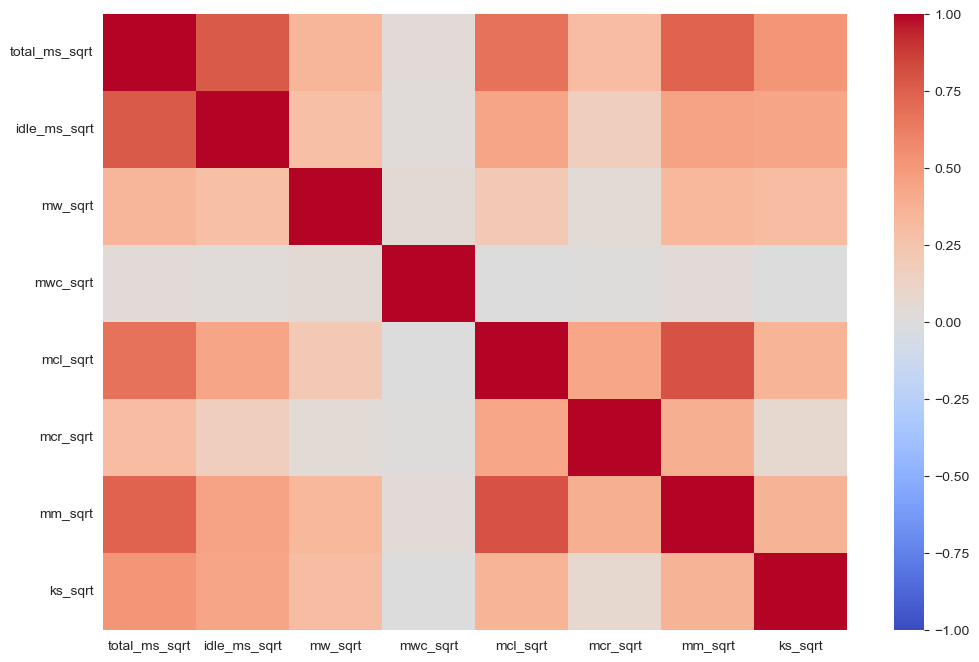

In [85]:
fig, ax = plt.subplots(figsize=(12, 8))

sns.heatmap(data = inputs_sqrt_df.loc[:, sqrt_vars].corr(),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm',
            ax=ax)

plt.show()

## Explore the intermediate output data

In [86]:
interim_df = interim_init.copy()

In [87]:
interim_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sid           115 non-null    int64  
 1   interim_scr2  115 non-null    float64
 2   interim_scr3  115 non-null    float64
 3   interim_scr4  115 non-null    float64
 4   interim_scr5  115 non-null    float64
 5   interim_scr6  115 non-null    float64
dtypes: float64(5), int64(1)
memory usage: 5.5 KB


In [88]:
interim_df

,sid,interim_scr2,interim_scr3,interim_scr4,interim_scr5,interim_scr6
0,1,5.0,0.0,4.5,4.0,2.25
1,2,4.0,3.5,4.5,4.0,1.00
2,3,3.5,3.5,4.5,4.0,0.00
3,4,6.0,4.0,5.0,3.5,2.75
4,5,5.0,4.0,5.0,4.0,2.75
...,...,...,...,...,...,...
110,111,3.0,0.0,0.0,3.0,0.00
111,112,0.0,0.0,0.0,0.0,0.00
112,113,0.0,0.0,0.0,0.0,0.00
113,114,0.0,0.0,0.0,0.0,0.00


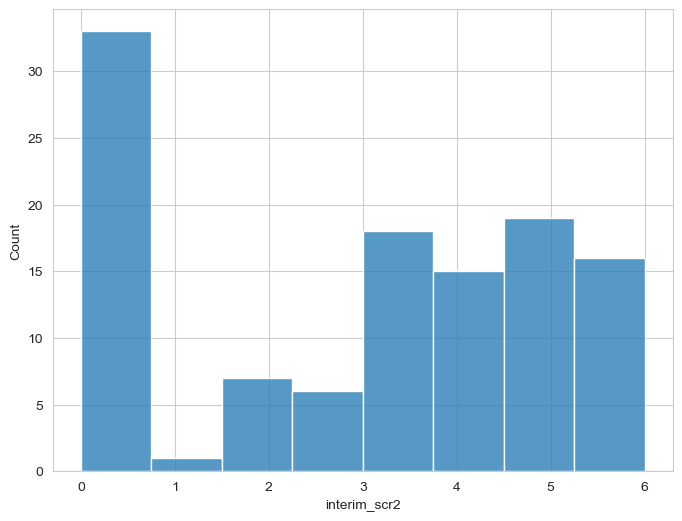

In [89]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_scr2', ax=ax)

plt.show()

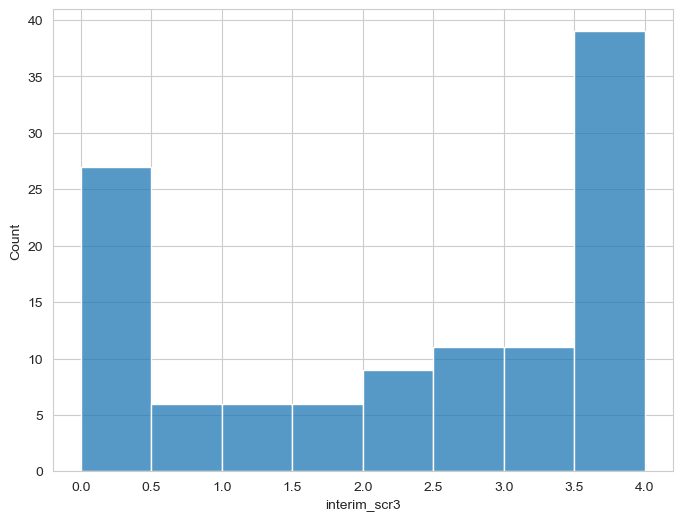

In [90]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_scr3', ax=ax)

plt.show()

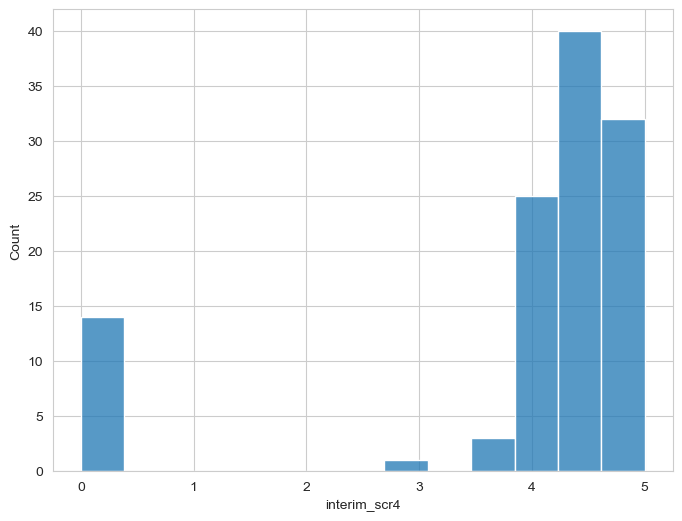

In [91]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_scr4', ax=ax)

plt.show()

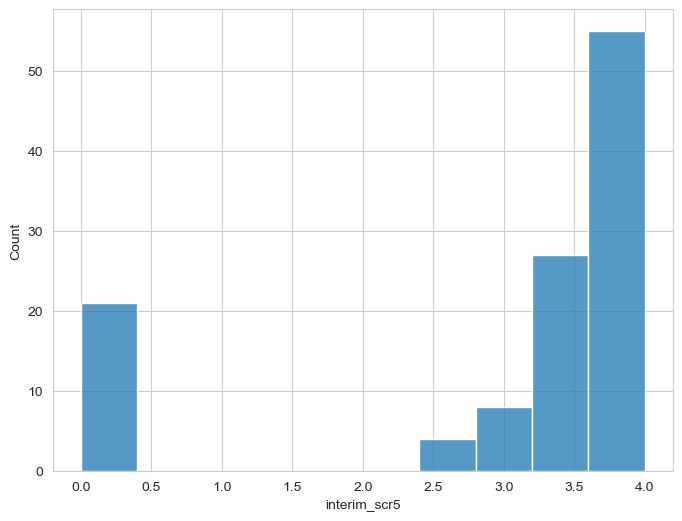

In [92]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_scr5', ax=ax)

plt.show()

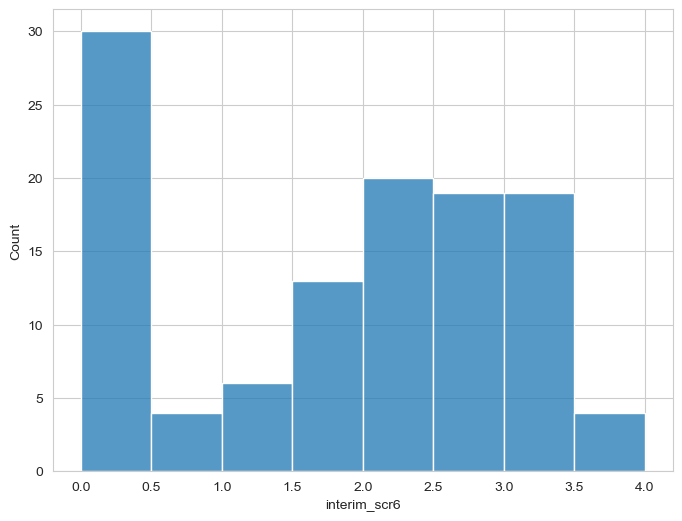

In [93]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_scr6', ax=ax)

plt.show()

#### Point plots show the inermediate progress for each student

In [94]:
interim_lf = interim_df.melt( id_vars=['sid']).\
             rename(columns={"variable": "interim_session", "value": "interim_score"}).\
             copy()

In [95]:
interim_lf['sess'] = interim_lf.interim_session.str.extract('(\d+)')

In [96]:
interim_lf['sess'] = [x.strip() for x in interim_lf.sess]

In [97]:
interim_lf['sess'] = interim_lf['sess'].astype('int')

In [98]:
interim_lf

,sid,interim_session,interim_score,sess
0,1,interim_scr2,5.0,2
1,2,interim_scr2,4.0,2
2,3,interim_scr2,3.5,2
3,4,interim_scr2,6.0,2
4,5,interim_scr2,5.0,2
...,...,...,...,...
570,111,interim_scr6,0.0,6
571,112,interim_scr6,0.0,6
572,113,interim_scr6,0.0,6
573,114,interim_scr6,0.0,6


In [99]:
interim_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575 entries, 0 to 574
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sid              575 non-null    int64  
 1   interim_session  575 non-null    object 
 2   interim_score    575 non-null    float64
 3   sess             575 non-null    int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 18.1+ KB


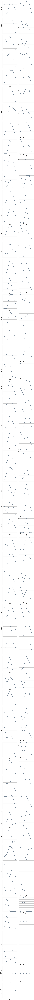

In [100]:
sns.catplot(data=interim_lf, x='sess', y='interim_score', 
            col = 'sid', kind='point', color='slategray',
            col_wrap=2, sharey=False, sharex=False)

plt.show()

## Explore the final output data

In [101]:
final_df = final_init.copy()

In [102]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   sid          62 non-null     int64  
 1   Es_1q1       62 non-null     float64
 2   Es_1q2       62 non-null     float64
 3   Es_2q1       62 non-null     float64
 4   Es_2q2       62 non-null     float64
 5   Es_3q1       62 non-null     float64
 6   Es_3q2       62 non-null     float64
 7   Es_3q3       62 non-null     float64
 8   Es_3q4       62 non-null     float64
 9   Es_3q5       62 non-null     float64
 10  Es_4q1       62 non-null     float64
 11  Es_4q2       62 non-null     float64
 12  Es_5q1       62 non-null     float64
 13  Es_5q2       62 non-null     float64
 14  Es_5q3       62 non-null     float64
 15  Es_6q1       62 non-null     float64
 16  Es_6q2       62 non-null     float64
 17  final_score  62 non-null     float64
 18  pass         62 non-null     int64  
dtypes: float64

In [103]:
pts_final_lookup.columns

Index(['question', 'question_points'], dtype='object')

In [104]:
pts_final = pts_final_lookup[['question', 'question_points']].copy()

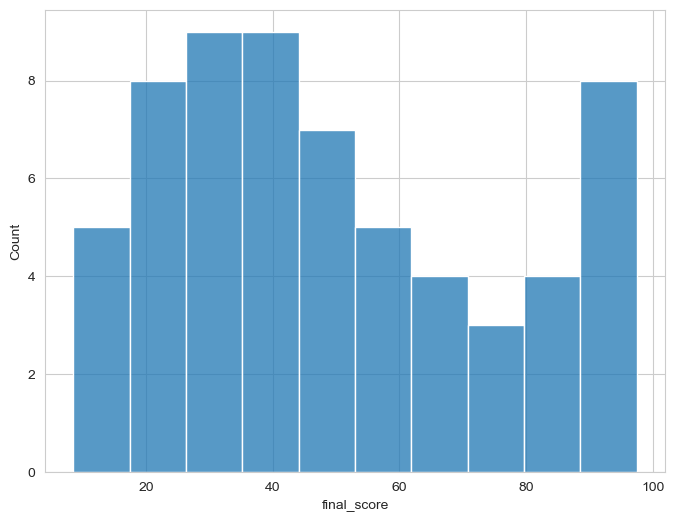

In [105]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=final_df, x='final_score', ax=ax, bins=10)

plt.show()

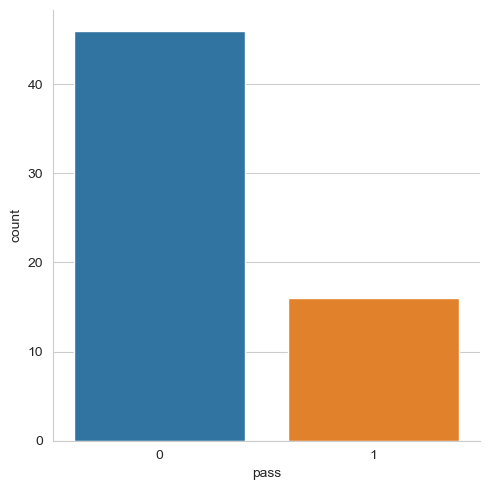

In [106]:
sns.catplot(data = final_df, x='pass', kind='count')

plt.show()

In [107]:
final_df['pass'].mean()

0.25806451612903225

#### Look at scores for each question of the question score by student

In [108]:
final_lf = final_df.melt( id_vars=['sid', 'final_score', 'pass']).\
           rename(columns={"variable": "question", 
                           "value": "question_score"}).\
           copy()

In [109]:
final_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 992 entries, 0 to 991
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   sid             992 non-null    int64  
 1   final_score     992 non-null    float64
 2   pass            992 non-null    int64  
 3   question        992 non-null    object 
 4   question_score  992 non-null    float64
dtypes: float64(2), int64(2), object(1)
memory usage: 38.9+ KB


In [110]:
pts_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   question         17 non-null     object
 1   question_points  17 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 400.0+ bytes


In [111]:
final_comp_lf = pd.merge(final_lf, pts_final, on=['question']).copy()

In [112]:
final_comp_lf.sort_values(by=['sid'])

,sid,final_score,pass,question,question_score,question_points
0,1,94.5,1,Es_1q1,2.0,2
124,1,94.5,1,Es_2q1,1.0,2
806,1,94.5,1,Es_5q3,3.0,3
620,1,94.5,1,Es_4q2,10.0,10
868,1,94.5,1,Es_6q1,25.0,25
...,...,...,...,...,...,...
185,106,71.0,1,Es_2q1,1.0,2
123,106,71.0,1,Es_1q2,3.0,3
61,106,71.0,1,Es_1q1,2.0,2
929,106,71.0,1,Es_6q1,25.0,25


In [113]:
final_comp_lf['question_pct'] = final_comp_lf['question_score'] / final_comp_lf['question_points']

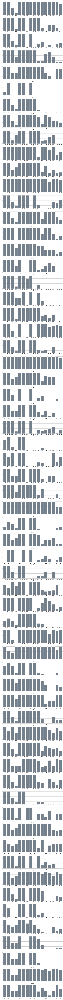

In [114]:
sns.catplot(data=final_comp_lf, x='question', y='question_pct', 
            col = 'sid', kind='bar', color='slategray',
            col_wrap=1, sharey=False, sharex=False, 
            height=3, aspect=4)

plt.show()

### Explore input unique counts and output data

#### Concatenate low and high participation student dataframes and join with `interim_lf`

In [115]:
high_counts_interim = pd.merge(interim_lf, sid_3high_sess_counts, on=['sid', 'sess'])

In [116]:
high_counts_interim.head()

,sid,interim_session,interim_score,sess,exer_uniq,actv_uniq,actv_grp_uniq
0,32,interim_scr2,5.5,2,7,25,9
1,44,interim_scr2,5.5,2,7,26,9
2,85,interim_scr2,6.0,2,7,24,8
3,32,interim_scr3,4.0,3,5,18,8
4,44,interim_scr3,4.0,3,5,19,9


In [117]:
low_counts_interim = pd.merge(interim_lf, sid_3low_sess_counts, on=['sid', 'sess'])

In [118]:
low_counts_interim.head()

,sid,interim_session,interim_score,sess,exer_uniq,actv_uniq,actv_grp_uniq
0,89,interim_scr3,1.5,3,4,11,7
1,57,interim_scr4,4.5,4,6,16,6
2,77,interim_scr4,4.0,4,6,16,6
3,89,interim_scr4,3.5,4,6,17,7
4,89,interim_scr5,2.5,5,2,6,5


In [119]:
var_list = uniq_vars + ['interim_score']

In [120]:
high_counts_interim.reset_index()[['sid','sess', var_list[0]]].pivot(index='sid', columns='sess', values=var_list[0])

sess,2,3,4,5,6
sid,,,,,
32,7,5,6,5,7
44,7,5,6,5,6
85,7,5,6,6,6


#### Heatmaps show participation and interim score for 3 low and 3 high participation students

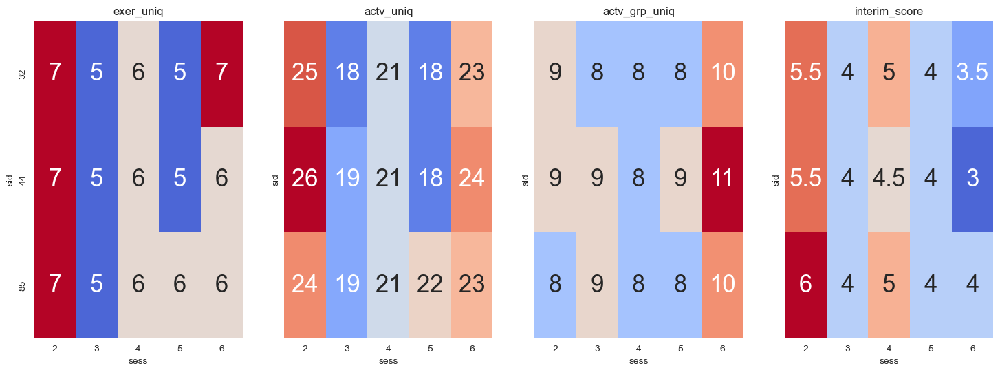

In [121]:
fig, axs = plt.subplots(1, len(var_list), figsize=(18,6), sharex=True, sharey=True)

for ix, x in enumerate(var_list):
    sns.heatmap(data = high_counts_interim.reset_index()[['sid','sess', x]].pivot(index='sid', columns='sess', values=x),
                center=high_counts_interim.reset_index()[x].mean(),
                cmap='coolwarm', cbar=False,
                annot=True, annot_kws={'size': 25},
                ax=axs[ix])
    
    axs[ix].set_title(x)

plt.show()

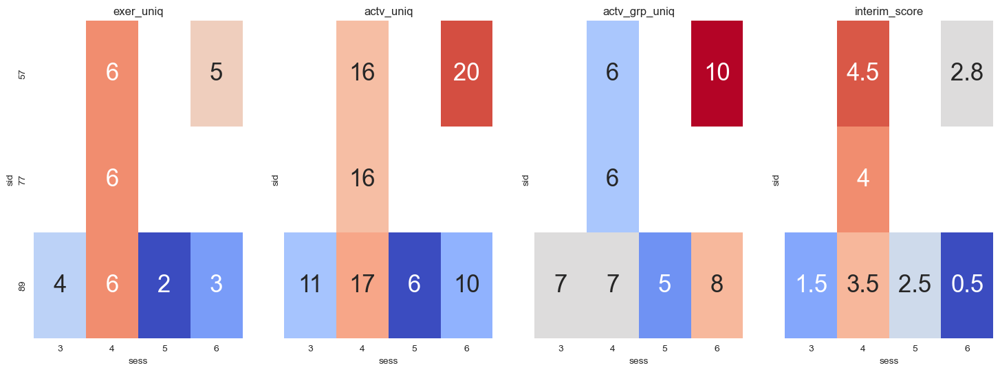

In [122]:
fig, axs = plt.subplots(1, len(var_list), figsize=(18,6), sharex=True, sharey=True)

for ix, x in enumerate(var_list):
    sns.heatmap(data = low_counts_interim.reset_index()[['sid','sess', x]].pivot(index='sid', columns='sess', values=x),
                center=low_counts_interim.reset_index()[x].mean(),
                cmap='coolwarm', cbar=False,
                annot=True, annot_kws={'size': 25},
                ax=axs[ix])
    
    axs[ix].set_title(x)

plt.show()

#### Scatter plots show relationship between unique counts of exercises, activities, and activity groups and students by session and interim score for all students

In [123]:
all_counts_interim = pd.merge(interim_lf, sid_sess_counts, on=['sid', 'sess'])

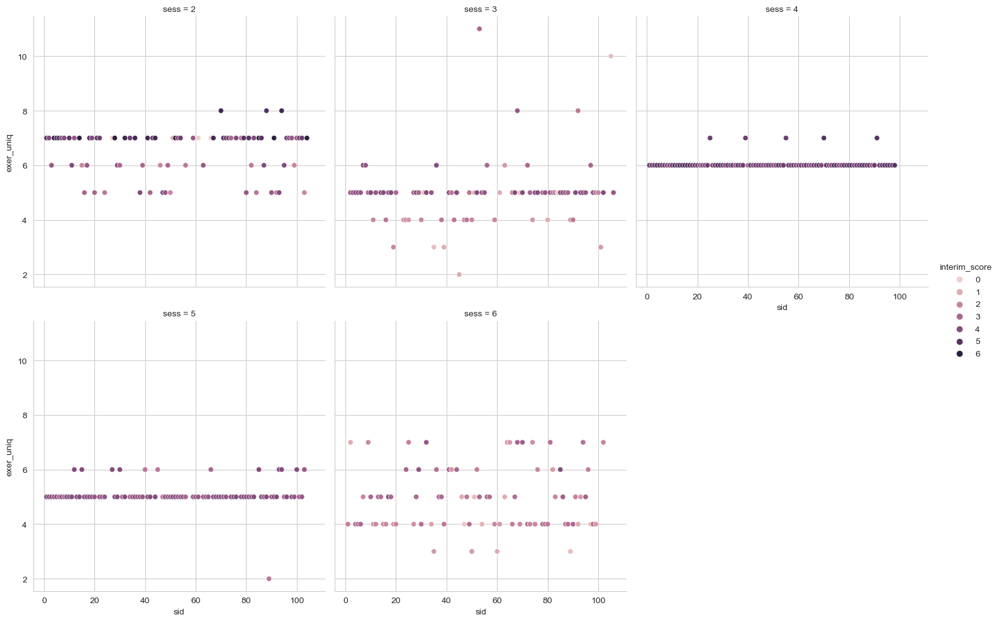

In [124]:
sns.relplot(data = all_counts_interim, x='sid', y='exer_uniq', col='sess', col_wrap=3, hue='interim_score')

plt.show()

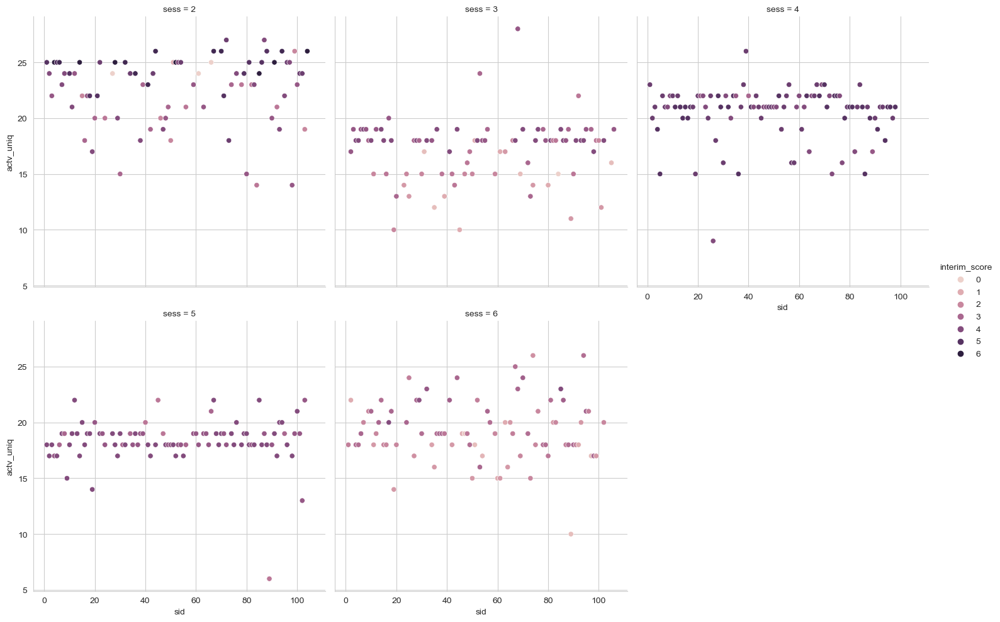

In [125]:
sns.relplot(data = all_counts_interim, x='sid', y='actv_uniq', col='sess', col_wrap=3, hue='interim_score')

plt.show()

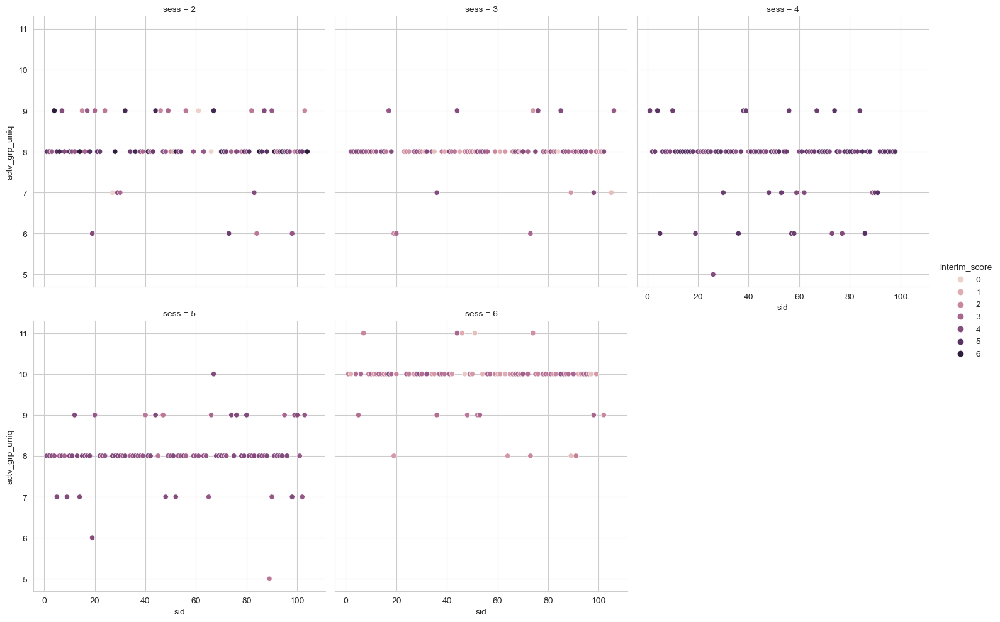

In [126]:
sns.relplot(data = all_counts_interim, x='sid', y='actv_grp_uniq', col='sess', col_wrap=3, hue='interim_score')

plt.show()

#### Scatter plots show relationship between students and interim scores by unique counts of activity groups and sessions for all students

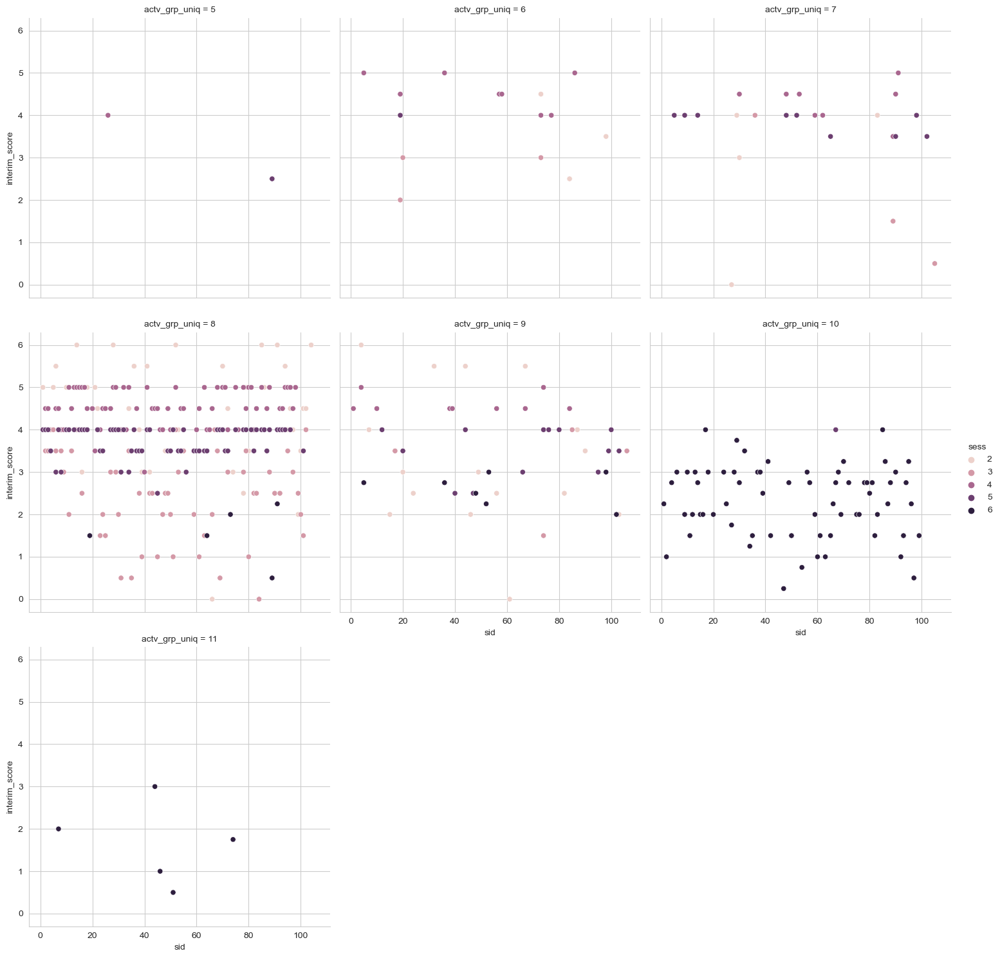

In [127]:
sns.relplot(data = all_counts_interim, x='sid', y='interim_score', col='actv_grp_uniq', col_wrap=3, hue='sess')

plt.show()

 #### Evaluate student progress with final scores

In [128]:
final_df.head()

,sid,Es_1q1,Es_1q2,Es_2q1,Es_2q2,Es_3q1,Es_3q2,Es_3q3,Es_3q4,Es_3q5,Es_4q1,Es_4q2,Es_5q1,Es_5q2,Es_5q3,Es_6q1,Es_6q2,final_score,pass
0,1,2.0,3.0,1.0,0.5,1.0,2.0,2.0,2.0,3.0,15.0,10.0,2.0,10.0,3.0,25.0,13.0,94.5,1
1,2,2.0,3.0,2.0,0.5,1.0,2.0,0.0,2.0,3.0,15.0,2.0,0.0,5.0,1.5,5.0,0.0,44.0,0
2,4,2.0,3.0,1.0,0.5,1.0,2.0,0.0,2.0,0.0,3.0,4.0,0.0,1.5,0.0,5.0,5.0,30.0,0
3,5,2.0,3.0,2.0,1.5,1.0,2.0,2.0,2.0,3.0,3.0,2.0,1.5,9.0,1.5,2.0,1.0,38.5,0
4,7,2.0,3.0,1.0,1.5,1.0,2.0,2.0,2.0,3.0,15.0,10.0,1.0,2.5,0.0,20.0,12.0,78.0,1


In [129]:
all_counts_final = pd.merge(final_df, sid_counts, on=['sid'])

In [130]:
all_counts_final.head()

,sid,Es_1q1,Es_1q2,Es_2q1,Es_2q2,Es_3q1,Es_3q2,Es_3q3,Es_3q4,Es_3q5,...,Es_5q2,Es_5q3,Es_6q1,Es_6q2,final_score,pass,sess_uniq,exer_uniq,actv_uniq,actv_grp_uniq
0,1,2.0,3.0,1.0,0.5,1.0,2.0,2.0,2.0,3.0,...,10.0,3.0,25.0,13.0,94.5,1,5,23,78,10
1,2,2.0,3.0,2.0,0.5,1.0,2.0,0.0,2.0,3.0,...,5.0,1.5,5.0,0.0,44.0,0,6,30,92,10
2,4,2.0,3.0,1.0,0.5,1.0,2.0,0.0,2.0,0.0,...,1.5,0.0,5.0,5.0,30.0,0,6,27,83,10
3,5,2.0,3.0,2.0,1.5,1.0,2.0,2.0,2.0,3.0,...,9.0,1.5,2.0,1.0,38.5,0,6,27,83,10
4,7,2.0,3.0,1.0,1.5,1.0,2.0,2.0,2.0,3.0,...,2.5,0.0,20.0,12.0,78.0,1,6,28,88,11


In [131]:
var_list_f = uniq_vars + ['final_score']

In [132]:
all_counts_final.reset_index()[['sid'] + var_list_f]

,sid,exer_uniq,actv_uniq,actv_grp_uniq,final_score
0,1,23,78,10,94.5
1,2,30,92,10,44.0
2,4,27,83,10,30.0
3,5,27,83,10,38.5
4,7,28,88,11,78.0
...,...,...,...,...,...
57,101,17,54,8,32.0
58,102,25,73,10,31.5
59,103,10,34,9,18.5
60,104,11,38,8,92.0


#### Scatter plots show the relationship between the number of unique exercises, activities, and activity groups and the final score

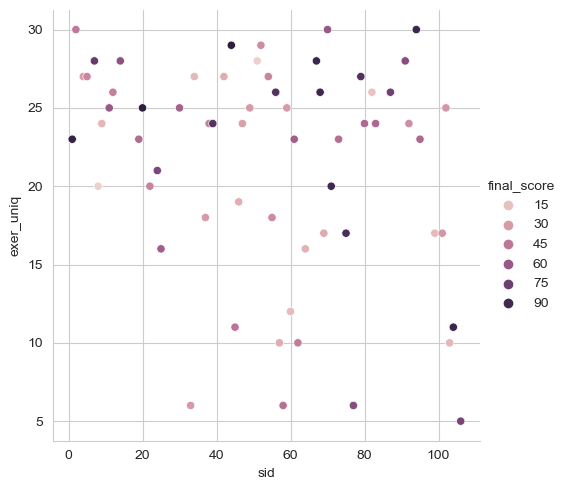

In [133]:
sns.relplot(data = all_counts_final, x='sid', y='exer_uniq', hue='final_score')

plt.show()

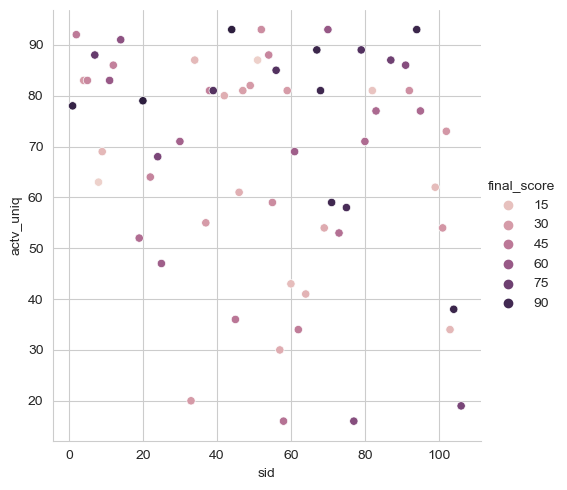

In [134]:
sns.relplot(data = all_counts_final, x='sid', y='actv_uniq', hue='final_score')

plt.show()

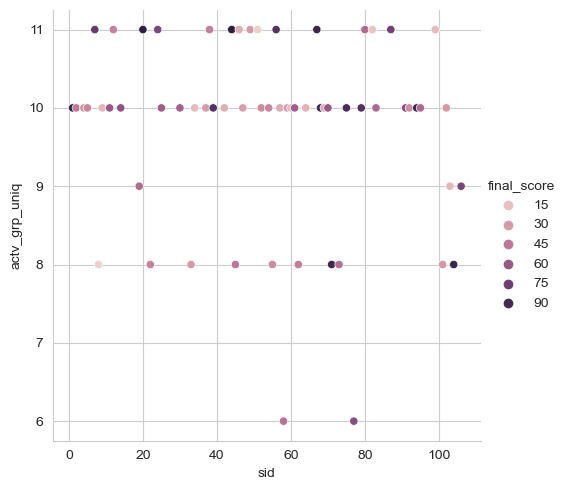

In [135]:
sns.relplot(data = all_counts_final, x='sid', y='actv_grp_uniq', hue='final_score')

plt.show()

In [136]:
all_counts_final_lf = all_counts_final.melt(id_vars=['sid', 'final_score'], value_vars=uniq_vars).copy()

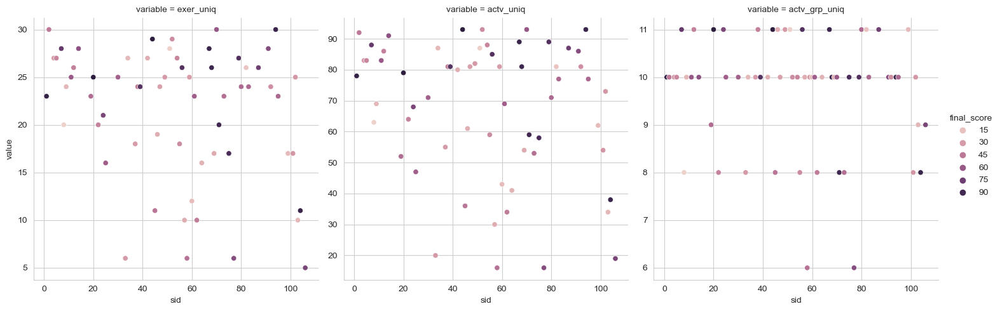

In [137]:
sns.relplot(data = all_counts_final_lf, x='sid', y='value', col='variable', hue='final_score', 
            facet_kws={'sharey': False, 'sharex': True})

plt.show()

### Explore input and output data by student

#### There is a positive relationship between the final score and final questions `Es_4q2`, `Es_6q1`, and `Es_6q2`. If students did well on these questions, they did well on the exam. Together these questions are worth 50% of the final score. 

#### The total time spent did not appear to have an effect on whether a student passed the final. However, the number of sessions and the variety of exercises and activities in which students participated did have an effect. While participating in more sessions and in a variety of exercise and activities did not guarantee a passing score, if students did not participate in at least four sessions (with the exception of two students) and in a variety of exercises and activities, they did not pass.

In [138]:
inputs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 31 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   sess           227129 non-null  object 
 1   sid            227129 non-null  object 
 2   start_dt       227129 non-null  object 
 3   end_dt         227128 non-null  object 
 4   exer           227129 non-null  object 
 5   actv           227129 non-null  object 
 6   actv_grp       227129 non-null  object 
 7   total_ms       227128 non-null  float64
 8   idle_ms        226971 non-null  float64
 9   mw             227129 non-null  int64  
 10  mwc            227129 non-null  int64  
 11  mcl            227129 non-null  int64  
 12  mcr            227129 non-null  int64  
 13  mm             227129 non-null  int64  
 14  ks             227129 non-null  int64  
 15  total_ms_wdz   227129 non-null  float64
 16  idle_ms_wdz    227129 non-null  float64
 17  mw_wdz         227129 non-nul

In [139]:
student_summ = inputs_sqrt_df.groupby(['sid']).\
            aggregate(total_ms_sqrt_avg = ('total_ms_sqrt', 'mean'),
                      idle_ms_sqrt_avg = ('idle_ms_sqrt', 'mean'),
                      mw_sqrt_avg = ('mw_sqrt', 'mean'),
                      mwc_sqrt_avg = ('mwc_sqrt', 'mean'),
                      mcl_sqrt_avg = ('mcl_sqrt', 'mean'),
                      mcr_sqrt_avg = ('mcr_sqrt', 'mean'),
                      mm_sqrt_avg = ('mm_sqrt', 'mean'),
                      ks_sqrt_avg = ('ks_sqrt', 'mean'),
                      sess_count = ('sess', 'nunique'),
                      exer_count = ('exer', 'nunique'),
                      act_count = ('actv_grp', 'nunique')).\
            reset_index().copy()

In [140]:
student_summ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 0 to 112
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sid                113 non-null    int64  
 1   total_ms_sqrt_avg  113 non-null    float64
 2   idle_ms_sqrt_avg   113 non-null    float64
 3   mw_sqrt_avg        113 non-null    float64
 4   mwc_sqrt_avg       113 non-null    float64
 5   mcl_sqrt_avg       113 non-null    float64
 6   mcr_sqrt_avg       113 non-null    float64
 7   mm_sqrt_avg        113 non-null    float64
 8   ks_sqrt_avg        113 non-null    float64
 9   sess_count         113 non-null    int64  
 10  exer_count         113 non-null    int64  
 11  act_count          113 non-null    int64  
dtypes: float64(8), int64(4)
memory usage: 10.7 KB


In [141]:
student_sess_summ = inputs_sqrt_df.groupby(['sid', 'sess', 'actv_grp']).\
            aggregate(total_ms_sqrt_avg = ('total_ms_sqrt', 'mean'),
                      idle_ms_sqrt_avg = ('idle_ms_sqrt', 'mean'),
                      mw_sqrt_avg = ('mw_sqrt', 'mean'),
                      mwc_sqrt_avg = ('mwc_sqrt', 'mean'),
                      mcl_sqrt_avg = ('mcl_sqrt', 'mean'),
                      mcr_sqrt_avg = ('mcr_sqrt', 'mean'),
                      mm_sqrt_avg = ('mm_sqrt', 'mean'),
                      ks_sqrt_avg = ('ks_sqrt', 'mean')).\
            reset_index().copy()

In [142]:
student_sess_summ

,sid,sess,actv_grp,total_ms_sqrt_avg,idle_ms_sqrt_avg,mw_sqrt_avg,mwc_sqrt_avg,mcl_sqrt_avg,mcr_sqrt_avg,mm_sqrt_avg,ks_sqrt_avg
0,1,1,Aulaweb,60.291591,89.807296,0.446259,0.0,1.532660,0.000000,15.575328,0.000000
1,1,1,Blank,23.650093,6.663881,0.000000,0.0,1.321056,0.209706,11.315140,0.031463
2,1,1,Deeds,84.505693,145.819385,0.065204,0.0,2.423351,0.322144,22.286720,0.331025
3,1,1,Diagram,181.633786,658.822559,0.085714,0.0,4.463416,0.587310,37.397646,0.057143
4,1,1,Other,44.700700,31.988323,0.159417,0.0,1.519802,0.047670,13.975898,0.329639
...,...,...,...,...,...,...,...,...,...,...,...
4243,114,1,Diagram,158.952642,330.417026,0.000000,0.0,4.270376,0.056569,19.365146,0.080000
4244,114,1,Other,57.737868,64.730754,0.000000,0.0,1.216363,0.022688,6.911911,0.911578
4245,114,1,Properties,24.490637,13.140994,0.000000,0.0,1.242434,0.000000,5.467689,0.000000
4246,114,1,Study,74.328287,67.648816,0.000000,0.0,1.364039,0.000000,7.665700,0.133333


In [143]:
student_sess_summ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4248 entries, 0 to 4247
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sid                4248 non-null   int64  
 1   sess               4248 non-null   int64  
 2   actv_grp           4248 non-null   object 
 3   total_ms_sqrt_avg  4248 non-null   float64
 4   idle_ms_sqrt_avg   4248 non-null   float64
 5   mw_sqrt_avg        4248 non-null   float64
 6   mwc_sqrt_avg       4248 non-null   float64
 7   mcl_sqrt_avg       4248 non-null   float64
 8   mcr_sqrt_avg       4248 non-null   float64
 9   mm_sqrt_avg        4248 non-null   float64
 10  ks_sqrt_avg        4248 non-null   float64
dtypes: float64(8), int64(2), object(1)
memory usage: 365.2+ KB


#### Inputs and Intermediate Scores

In [144]:
interim_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575 entries, 0 to 574
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sid              575 non-null    int64  
 1   interim_session  575 non-null    object 
 2   interim_score    575 non-null    float64
 3   sess             575 non-null    int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 18.1+ KB


In [145]:
interim_lf['sid'] = interim_lf['sid'].astype('int')
interim_lf['sess'] = interim_lf['sess'].astype('int')

In [146]:
by_student_interim_init = pd.merge(interim_lf.drop(columns=['interim_session'].copy()), student_sess_summ, 
                                   on=['sid','sess'], how='left')

In [147]:
by_student_interim_init.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3779 entries, 0 to 3778
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sid                3779 non-null   int64  
 1   interim_score      3779 non-null   float64
 2   sess               3779 non-null   int64  
 3   actv_grp           3642 non-null   object 
 4   total_ms_sqrt_avg  3642 non-null   float64
 5   idle_ms_sqrt_avg   3642 non-null   float64
 6   mw_sqrt_avg        3642 non-null   float64
 7   mwc_sqrt_avg       3642 non-null   float64
 8   mcl_sqrt_avg       3642 non-null   float64
 9   mcr_sqrt_avg       3642 non-null   float64
 10  mm_sqrt_avg        3642 non-null   float64
 11  ks_sqrt_avg        3642 non-null   float64
dtypes: float64(9), int64(2), object(1)
memory usage: 383.8+ KB


In [148]:
by_student_interim_init

,sid,interim_score,sess,actv_grp,total_ms_sqrt_avg,idle_ms_sqrt_avg,mw_sqrt_avg,mwc_sqrt_avg,mcl_sqrt_avg,mcr_sqrt_avg,mm_sqrt_avg,ks_sqrt_avg
0,1,5.0,2,Aulaweb,19.023607,5.364728,0.000000,0.0,1.660312,0.000000,9.816710,0.000000
1,1,5.0,2,Blank,13.122374,4.530336,0.039229,0.0,1.335669,0.124054,9.710477,0.000000
2,1,5.0,2,Deeds,94.955802,196.928061,0.168232,0.0,2.899294,0.408978,23.214648,0.366994
3,1,5.0,2,Diagram,102.537769,223.944413,0.000000,0.0,2.703978,0.036262,23.804276,0.000000
4,1,5.0,2,Other,40.282864,13.255219,0.420092,0.0,1.743471,0.000000,13.599805,0.161676
...,...,...,...,...,...,...,...,...,...,...,...,...
3774,111,0.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3775,112,0.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3776,113,0.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3777,114,0.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [149]:
by_student_interim_df = by_student_interim_init.copy()

In [150]:
by_student_interim_lf = by_student_interim_df.melt(id_vars=['sid', 'sess', 'actv_grp', 'interim_score'])

In [151]:
by_student_interim_lf

,sid,sess,actv_grp,interim_score,variable,value
0,1,2,Aulaweb,5.0,total_ms_sqrt_avg,19.023607
1,1,2,Blank,5.0,total_ms_sqrt_avg,13.122374
2,1,2,Deeds,5.0,total_ms_sqrt_avg,94.955802
3,1,2,Diagram,5.0,total_ms_sqrt_avg,102.537769
4,1,2,Other,5.0,total_ms_sqrt_avg,40.282864
...,...,...,...,...,...,...
30227,111,6,NaN,0.0,ks_sqrt_avg,NaN
30228,112,6,NaN,0.0,ks_sqrt_avg,NaN
30229,113,6,NaN,0.0,ks_sqrt_avg,NaN
30230,114,6,NaN,0.0,ks_sqrt_avg,NaN


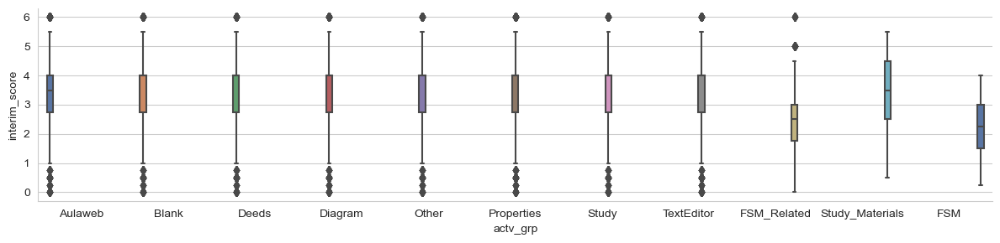

In [152]:
sns.catplot(data=by_student_interim_lf, x = 'actv_grp', y = 'interim_score', 
            kind = 'box', palette='deep',
            hue = 'actv_grp', height=3, aspect=4, 
            sharey=False, sharex=False)

plt.show()

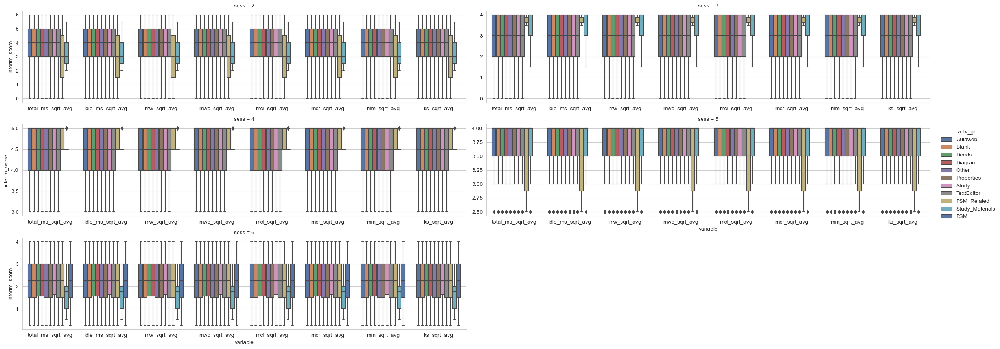

In [153]:
sns.catplot(data=by_student_interim_lf, x = 'variable', y = 'interim_score', 
            col = 'sess', col_wrap = 2, kind = 'box', palette='deep',
            hue = 'actv_grp', height=3, aspect=4, 
            sharey=False, sharex=False)

plt.show()

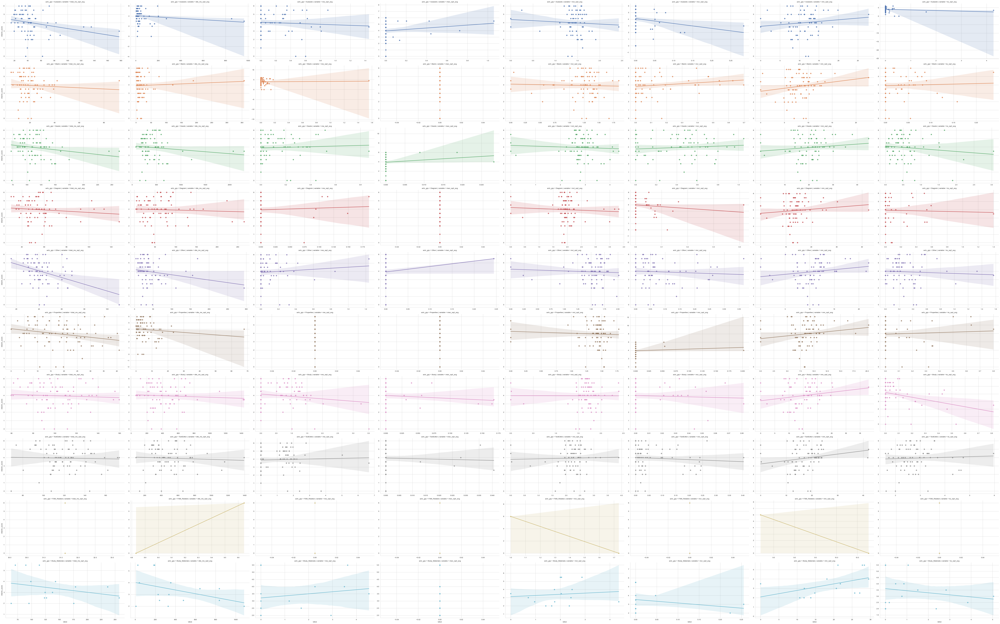

In [154]:
sns.lmplot(data = by_student_interim_lf.loc[by_student_interim_lf.sess == 2], x='value', y='interim_score', 
           col='variable', row='actv_grp', hue='actv_grp', palette='deep',
           aspect=2, facet_kws=dict(sharex=False, sharey=False))

plt.show()

In [155]:
by_student_interim_lf.variable.unique()

array(['total_ms_sqrt_avg', 'idle_ms_sqrt_avg', 'mw_sqrt_avg',
       'mwc_sqrt_avg', 'mcl_sqrt_avg', 'mcr_sqrt_avg', 'mm_sqrt_avg',
       'ks_sqrt_avg'], dtype=object)

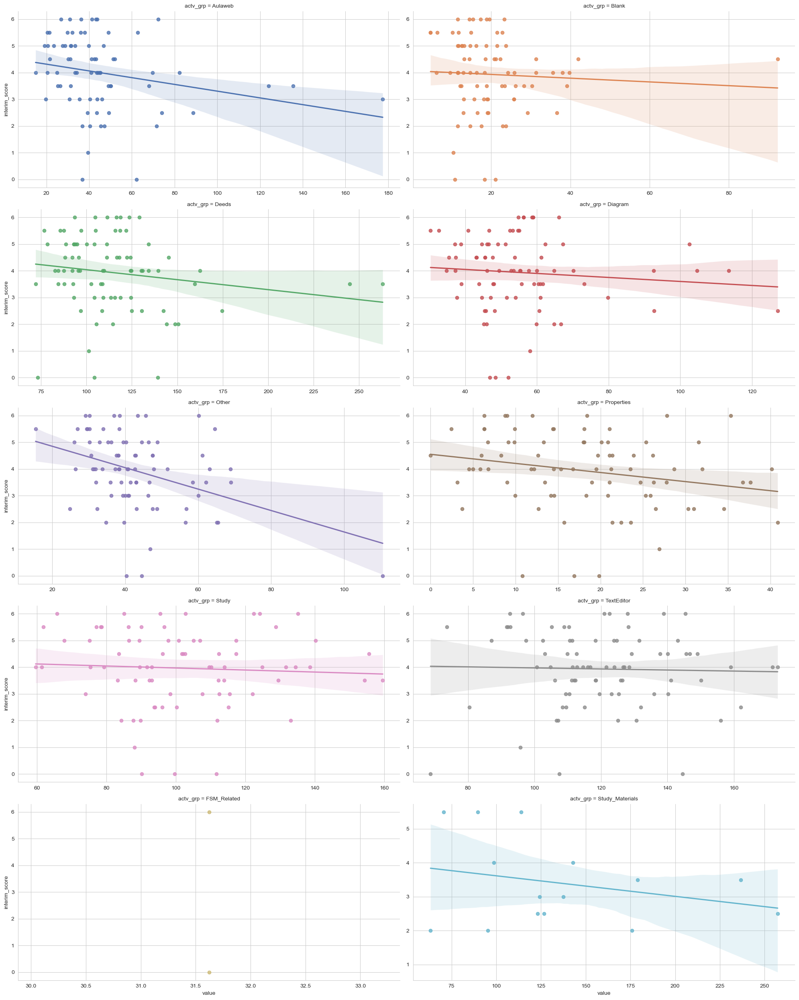

In [156]:
sns.lmplot(data = by_student_interim_lf.loc[(by_student_interim_lf['variable'] == 'total_ms_sqrt_avg') & (by_student_interim_lf['sess'] == 2)], 
           x='value', y='interim_score', 
           col='actv_grp', col_wrap = 2, hue='actv_grp', palette='deep',
           aspect=2, facet_kws=dict(sharex=False, sharey=False))

plt.show()

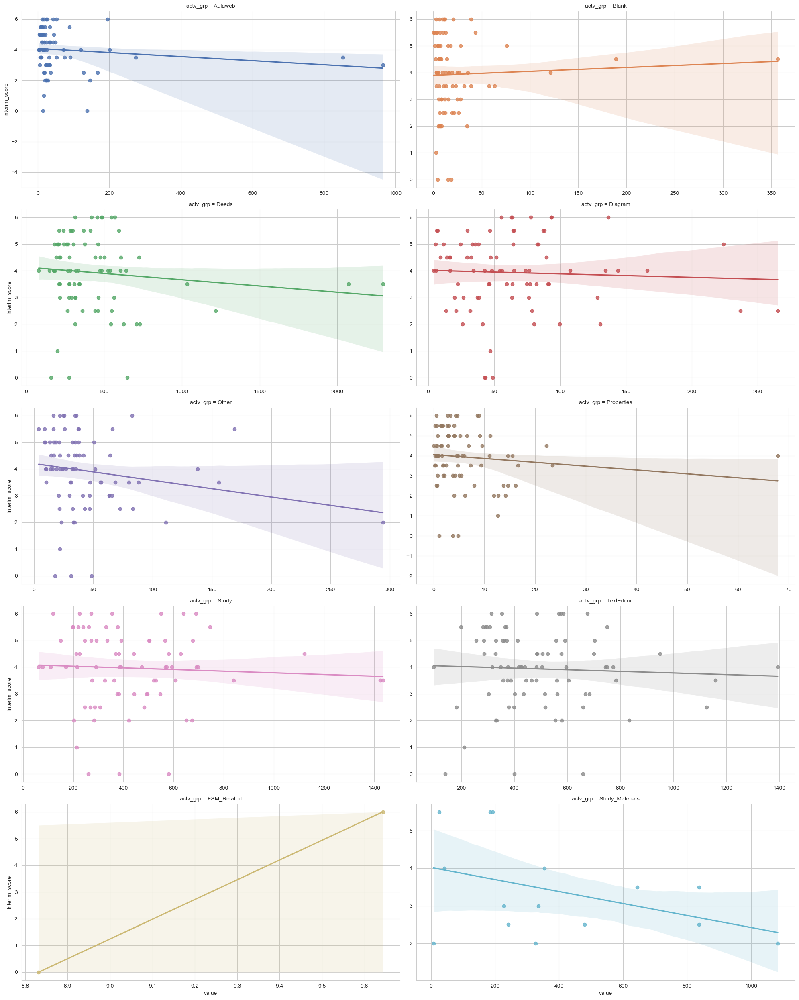

In [157]:
sns.lmplot(data = by_student_interim_lf.loc[(by_student_interim_lf['variable'] == 'idle_ms_sqrt_avg') & (by_student_interim_lf['sess'] == 2)], 
           x='value', y='interim_score', 
           col='actv_grp', col_wrap = 2, hue='actv_grp', palette='deep',
           aspect=2, facet_kws=dict(sharex=False, sharey=False))

plt.show()

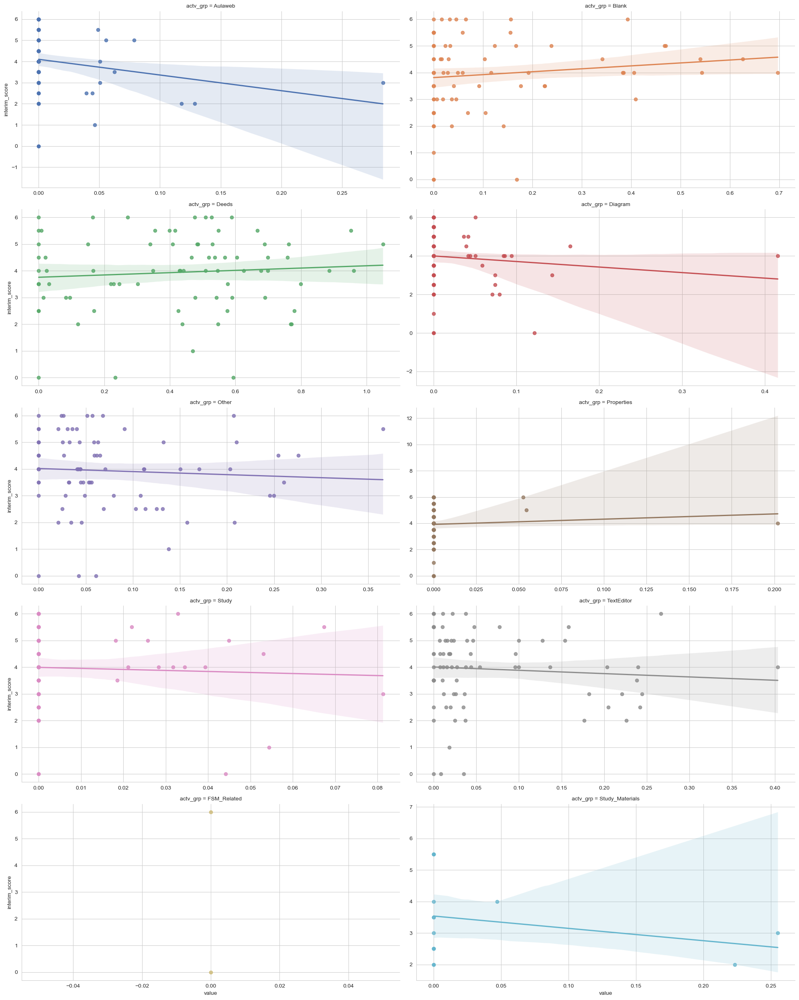

In [158]:
sns.lmplot(data = by_student_interim_lf.loc[(by_student_interim_lf['variable'] == 'mcr_sqrt_avg') & (by_student_interim_lf['sess'] == 2)], 
           x='value', y='interim_score', 
           col='actv_grp', col_wrap = 2, hue='actv_grp', palette='deep',
           aspect=2, facet_kws=dict(sharex=False, sharey=False))

plt.show()

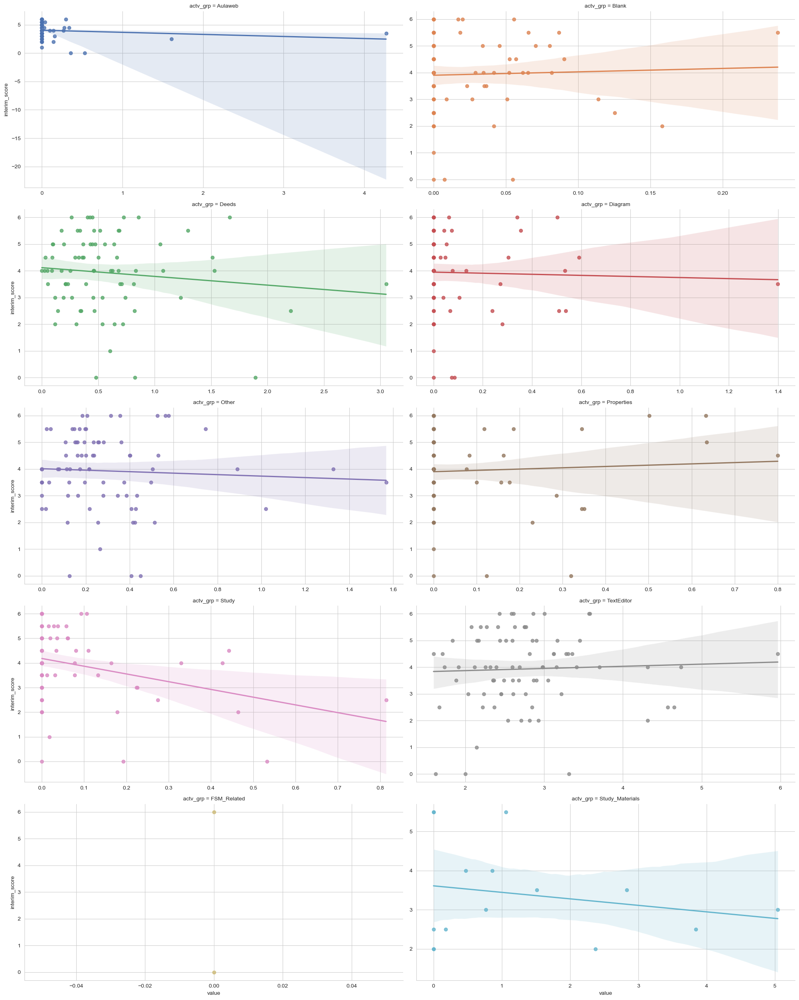

In [159]:
sns.lmplot(data = by_student_interim_lf.loc[(by_student_interim_lf['variable'] == 'ks_sqrt_avg') & (by_student_interim_lf['sess'] == 2)], 
           x='value', y='interim_score', 
           col='actv_grp', col_wrap = 2, hue='actv_grp', palette='deep',
           aspect=2, facet_kws=dict(sharex=False, sharey=False))

plt.show()

#### Inputs and Final Score

In [160]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   sid          62 non-null     int64  
 1   Es_1q1       62 non-null     float64
 2   Es_1q2       62 non-null     float64
 3   Es_2q1       62 non-null     float64
 4   Es_2q2       62 non-null     float64
 5   Es_3q1       62 non-null     float64
 6   Es_3q2       62 non-null     float64
 7   Es_3q3       62 non-null     float64
 8   Es_3q4       62 non-null     float64
 9   Es_3q5       62 non-null     float64
 10  Es_4q1       62 non-null     float64
 11  Es_4q2       62 non-null     float64
 12  Es_5q1       62 non-null     float64
 13  Es_5q2       62 non-null     float64
 14  Es_5q3       62 non-null     float64
 15  Es_6q1       62 non-null     float64
 16  Es_6q2       62 non-null     float64
 17  final_score  62 non-null     float64
 18  pass         62 non-null     int64  
dtypes: float64

In [161]:
final_df.columns

Index(['sid', 'Es_1q1', 'Es_1q2', 'Es_2q1', 'Es_2q2', 'Es_3q1', 'Es_3q2',
       'Es_3q3', 'Es_3q4', 'Es_3q5', 'Es_4q1', 'Es_4q2', 'Es_5q1', 'Es_5q2',
       'Es_5q3', 'Es_6q1', 'Es_6q2', 'final_score', 'pass'],
      dtype='object')

In [162]:
by_student_final_init = pd.merge(student_summ, final_df, on='sid', how='left')

In [163]:
by_student_final_init.rename(columns={"Es_1_1": "final_Es_1_1", "Es_1_2": "final_Es_1_2", "Es_2_1": "final_Es_2_1", 
                              "Es_2_2": "final_Es_2_2", "Es_3_1": "final_Es_3_1", "Es_3_2": "final_Es_3_2", 
                              "Es_3_3": "final_Es_3_3", "Es_3_4": "final_Es_3_4", "Es_3_5": "final_Es_3_5", 
                              "Es_4_1": "final_Es_4_1", "Es_4_2": "final_Es_4_2", "Es_5_1": "final_Es_5_1", 
                              "Es_5_2": "final_Es_5_2", "Es_5_3": "final_Es_5_3", "Es_6_1": "final_Es_6_1", 
                              "Es_6_2": "final_Es_6_2"}, inplace=True)

In [164]:
by_student_final_init.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113 entries, 0 to 112
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sid                113 non-null    int64  
 1   total_ms_sqrt_avg  113 non-null    float64
 2   idle_ms_sqrt_avg   113 non-null    float64
 3   mw_sqrt_avg        113 non-null    float64
 4   mwc_sqrt_avg       113 non-null    float64
 5   mcl_sqrt_avg       113 non-null    float64
 6   mcr_sqrt_avg       113 non-null    float64
 7   mm_sqrt_avg        113 non-null    float64
 8   ks_sqrt_avg        113 non-null    float64
 9   sess_count         113 non-null    int64  
 10  exer_count         113 non-null    int64  
 11  act_count          113 non-null    int64  
 12  Es_1q1             62 non-null     float64
 13  Es_1q2             62 non-null     float64
 14  Es_2q1             62 non-null     float64
 15  Es_2q2             62 non-null     float64
 16  Es_3q1             62 non-

In [165]:
by_student_final_df = by_student_final_init.copy()

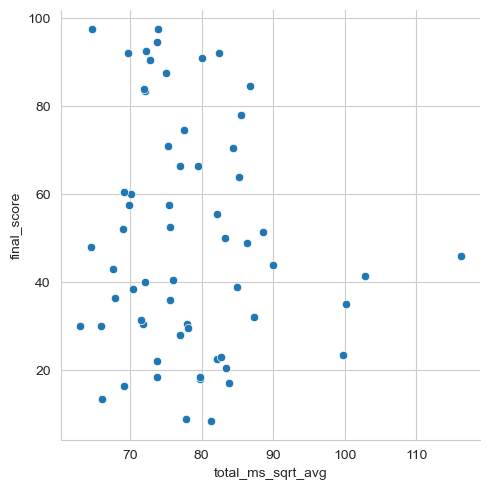

In [166]:
sns.relplot(data = by_student_final_df, x='total_ms_sqrt_avg', y='final_score', kind='scatter')

plt.show()

In [167]:
by_student_final_df.columns

Index(['sid', 'total_ms_sqrt_avg', 'idle_ms_sqrt_avg', 'mw_sqrt_avg',
       'mwc_sqrt_avg', 'mcl_sqrt_avg', 'mcr_sqrt_avg', 'mm_sqrt_avg',
       'ks_sqrt_avg', 'sess_count', 'exer_count', 'act_count', 'Es_1q1',
       'Es_1q2', 'Es_2q1', 'Es_2q2', 'Es_3q1', 'Es_3q2', 'Es_3q3', 'Es_3q4',
       'Es_3q5', 'Es_4q1', 'Es_4q2', 'Es_5q1', 'Es_5q2', 'Es_5q3', 'Es_6q1',
       'Es_6q2', 'final_score', 'pass'],
      dtype='object')

In [168]:
by_student_final_lf = by_student_final_df.melt(id_vars=['sid', 'final_score', 'pass'])

In [169]:
by_student_final_lf.isna().sum()

sid               0
final_score    1377
pass           1377
variable          0
value           816
dtype: int64

In [170]:
by_student_final_lf.variable.unique()

array(['total_ms_sqrt_avg', 'idle_ms_sqrt_avg', 'mw_sqrt_avg',
       'mwc_sqrt_avg', 'mcl_sqrt_avg', 'mcr_sqrt_avg', 'mm_sqrt_avg',
       'ks_sqrt_avg', 'sess_count', 'exer_count', 'act_count', 'Es_1q1',
       'Es_1q2', 'Es_2q1', 'Es_2q2', 'Es_3q1', 'Es_3q2', 'Es_3q3',
       'Es_3q4', 'Es_3q5', 'Es_4q1', 'Es_4q2', 'Es_5q1', 'Es_5q2',
       'Es_5q3', 'Es_6q1', 'Es_6q2'], dtype=object)

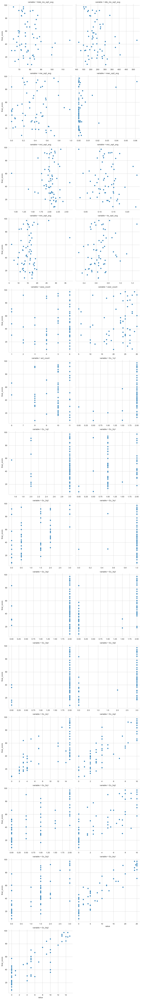

In [171]:
sns.relplot(data = by_student_final_lf, x='value', y='final_score', 
            col='variable', col_wrap=2, 
            kind='scatter', facet_kws={'sharex': False})

plt.show()

In [172]:
pts_final

,question,question_points
0,Es_1q1,2
1,Es_1q2,3
2,Es_2q1,2
3,Es_2q2,3
4,Es_3q1,1
5,Es_3q2,2
6,Es_3q3,2
7,Es_3q4,2
8,Es_3q5,3
9,Es_4q1,15


In [173]:
by_student_final_df

,sid,total_ms_sqrt_avg,idle_ms_sqrt_avg,mw_sqrt_avg,mwc_sqrt_avg,mcl_sqrt_avg,mcr_sqrt_avg,mm_sqrt_avg,ks_sqrt_avg,sess_count,...,Es_3q5,Es_4q1,Es_4q2,Es_5q1,Es_5q2,Es_5q3,Es_6q1,Es_6q2,final_score,pass
0,1,73.788436,154.779253,0.438855,0.000000,2.154162,0.100167,18.288536,0.575429,5,...,3.0,15.0,10.0,2.0,10.0,3.0,25.0,13.0,94.5,1.0
1,2,89.933800,302.859102,0.492373,0.000000,2.087846,0.149846,14.232934,0.924389,6,...,3.0,15.0,2.0,0.0,5.0,1.5,5.0,0.0,44.0,0.0
2,3,67.607202,177.972725,0.200320,0.000000,2.010457,0.146013,13.700542,0.648768,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,62.942091,158.045946,0.389018,0.003008,1.661840,0.055576,9.571955,0.721963,6,...,0.0,3.0,4.0,0.0,1.5,0.0,5.0,5.0,30.0,0.0
4,5,70.455967,149.440560,0.512454,0.000000,1.993788,0.150808,19.069058,0.673137,6,...,3.0,3.0,2.0,1.5,9.0,1.5,2.0,1.0,38.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,110,69.048451,157.689999,0.371386,0.000000,2.058844,0.106372,14.245068,0.547387,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109,111,72.166219,96.645577,0.000000,0.000000,2.087146,0.213448,13.376083,0.407551,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
110,112,82.276579,202.644242,0.234535,0.003961,1.934829,0.106930,17.046930,0.468303,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
111,113,81.240771,177.109727,0.000000,0.000000,1.940302,0.183114,12.548179,0.373359,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


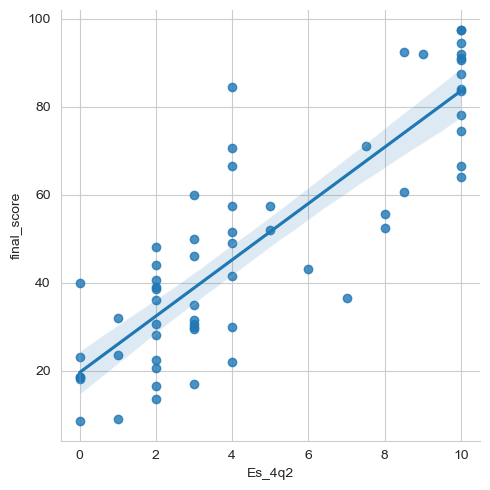

In [174]:
sns.lmplot(data = by_student_final_df, x='Es_4q2', y='final_score')

plt.show()

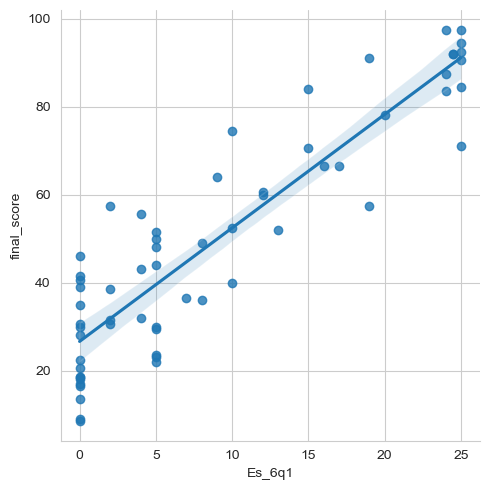

In [175]:
sns.lmplot(data = by_student_final_df, x='Es_6q1', y='final_score')

plt.show()

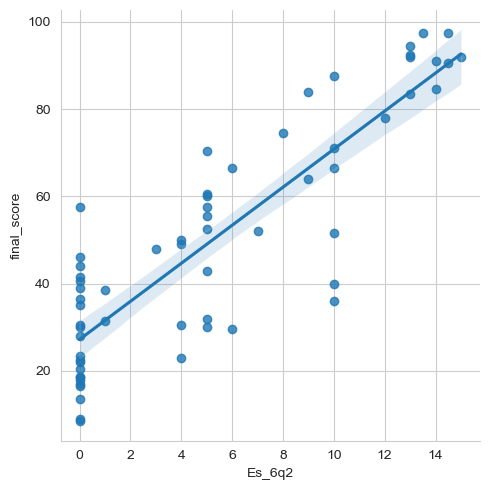

In [176]:
sns.lmplot(data = by_student_final_df, x='Es_6q2', y='final_score')

plt.show()

#### The box plots below show that participation in the session, exercises, and activities influences final grades

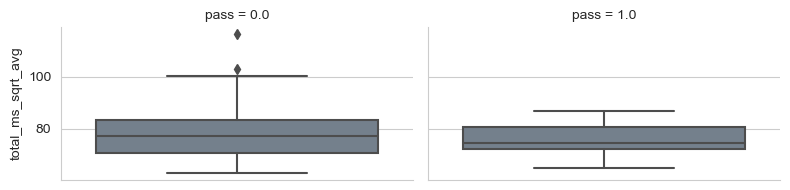

In [177]:
sns.catplot(data=by_student_final_df, 
            y='total_ms_sqrt_avg', col='pass', 
            kind='box', 
            color='slategray',
            sharex = False, height=2, aspect=2)

plt.show()

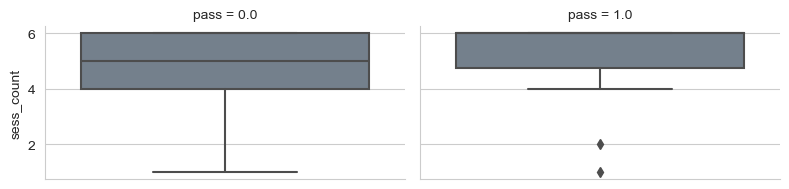

In [178]:
sns.catplot(data=by_student_final_df, 
            y='sess_count', col='pass', 
            kind='box', 
            color='slategray',
            sharex = False, height=2, aspect=2)

plt.show()

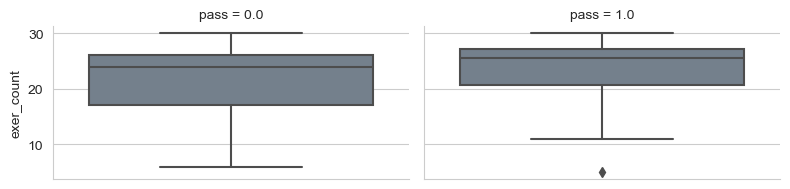

In [179]:
sns.catplot(data=by_student_final_df, 
            y='exer_count', col='pass', 
            kind='box',
            color='slategray',
            sharex = False, height=2, aspect=2)

plt.show()

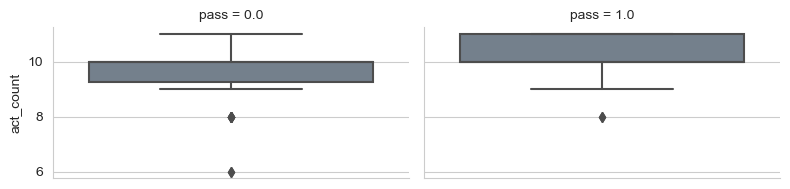

In [180]:
sns.catplot(data=by_student_final_df, 
            y='act_count', col='pass', 
            kind='box',
            color='slategray',
            sharex = False, height=2, aspect=2)

plt.show()